# Artificial Intelligence for Cybersecurity Project
**Venturini Francesco** No. 548415

In [366]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.feature_selection import SelectKBest, chi2

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold


from sklearn.metrics import confusion_matrix, zero_one_loss, ConfusionMatrixDisplay, classification_report, accuracy_score

from sklearn.cluster import KMeans
from sklearn.metrics.cluster import contingency_matrix
from sklearn.metrics import homogeneity_completeness_v_measure
from sklearn.decomposition import PCA
from sklearn.neighbors import LocalOutlierFactor as LOF

# Dataset description and Goal
The dataset that has been chosen for the project is the **`UNSW-NB15`  dataset**, created by the IXIA PerfectStorm tool 
in the Cyber Range Lab of the Australian Centre for Cyber Security (ACCS) for generating a 
hybrid of real modern normal activities and synthetic contemporary attack behaviours. Tcpdump 
tool is utilised to capture 100 GB of the raw traffic (e.g., Pcap files). This data set has nine 
families of attacks, namely, `Fuzzers`, `Analysis`, `Backdoors`, `DoS`, `Exploits`, `Generic`, 
`Reconnaissance`, `Shellcode` and `Worms`. The Argus, Bro-IDS tools are utilised and twelve 
algorithms are developed to generate totally 49 features with the class label. These features are 
described in `UNSW-NB15_freatures.csv` file. The total number of records is two millions and 
540,044 which are stored in the four CSV files, namely, `UNSW-NB15_1.csv`, `UNSW-NB15_2.csv`, `UNSW-NB15_3.csv` and `UNSW-NB15_4.csv`. The ground truth table is named 
`UNSW-NB15_GT.csv` and the list of event file is called `UNSW-NB15_LIST_EVENTS.csv`. A
partition from this data set is configured as a training set and testing set, namely, 
`UNSW_NB15_training-set.csv` and `UNSW_NB15_testing-set.csv` respectively. The number of 
records in the training set is 82,332 records and the testing set is 175,341 records from different 
the types of attack and normal.

Input data files are available in the `datasets/UNSW-NB15` directory. The next cell will list all files under this directory.

The goal of this project is to devise a general classifier that categorizes each individual sample as one of the nine classes
seen before, with an appropriate accuracy and other performance metrics that will be evaluated and compared with existent works in the dedicated paragraph. 

The followed procedure is the classical one of the Data Mining process, thus:

1) **Data acquisition and exploration**: first phase with data harvesting 

2) **Data cleaning**: duplicate removal, missing values manage, erroneous data and other problems that affect data quality

3) **Data selection**: find relevant data for the analysis 

4) **Pre-processing**: data transformation in more useful formats (like standardization and categorical-variables encoding)

5) **Data modelling**: applying machine learning and data mining algorithms to build models that describes the data

6) **Evaluation**: accuracy of the model and its ability to predict future values

7) **Results interpretation**


# 1. Data Acquisition and Exlporation

Pandas utilities are used to retireve the dataset from the CSV files. The result of read_csv is stored into a DataFrame data structure, e.g., a two-dimensional table-like form. 

In [2]:
for dirname, _, filenames in os.walk('../datasets/UNSW-NB15/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
dataset_root = '../datasets/UNSW-NB15/'

# datasets are switched
test = pd.read_csv(dataset_root + 'a part of training and testing set/UNSW_NB15_training-set.csv')
train = pd.read_csv(dataset_root + 'a part of training and testing set/UNSW_NB15_testing-set.csv')

# otherwise UTF-8 decoding error, Windows codepage 1252 is used
features = pd.read_csv(dataset_root + 'UNSW-NB15_features.csv', encoding='cp1252').set_index('No.') 
list_events = pd.read_csv(dataset_root + 'UNSW-NB15_LIST_EVENTS.csv')

# train and test set concatenation
train['type'] = 'train'
test['type'] = 'test'
df_total = pd.concat([train, test], axis=0, ignore_index=True)

# to see all the columns in outputs
pd.set_option('display.max_columns', None) 
df_total

../datasets/UNSW-NB15/The UNSW-NB15 description.pdf
../datasets/UNSW-NB15/UNSW-NB15_1.csv
../datasets/UNSW-NB15/UNSW-NB15_2.csv
../datasets/UNSW-NB15/UNSW-NB15_3.csv
../datasets/UNSW-NB15/UNSW-NB15_4.csv
../datasets/UNSW-NB15/UNSW-NB15_features.csv
../datasets/UNSW-NB15/UNSW-NB15_GT.csv
../datasets/UNSW-NB15/UNSW-NB15_LIST_EVENTS.csv
../datasets/UNSW-NB15/a part of training and testing set\UNSW_NB15_testing-set.csv
../datasets/UNSW-NB15/a part of training and testing set\UNSW_NB15_training-set.csv


,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,252,254,1.415894e+04,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,255,0.000000,0.000000,0.000000,43,43,0,0,1,0,1,1,1,1,0,0,0,1,1,0,Normal,0,train
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,62,252,8.395112e+03,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,255,0.000000,0.000000,0.000000,52,1106,0,0,43,1,1,1,1,2,0,0,0,1,6,0,Normal,0,train
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,62,252,1.572272e+03,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,255,0.111897,0.061458,0.050439,46,824,0,0,7,1,2,1,1,3,0,0,0,2,6,0,Normal,0,train
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,62,252,2.740179e+03,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,255,0.000000,0.000000,0.000000,52,64,0,0,1,1,2,1,1,3,1,1,0,2,1,0,Normal,0,train
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,254,252,8.561499e+03,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,255,0.128381,0.071147,0.057234,53,45,0,0,43,1,2,2,1,40,0,0,0,2,39,0,Normal,0,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257668,82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,254,0,8.320000e+07,0.000000,0,0,0.005000,0.000000,0.000000,0.000000,0,0,0,0,0.000000,0.000000,0.000000,52,0,0,0,1,2,2,1,1,2,0,0,0,2,1,0,Normal,0,test
257669,82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,254,252,1.241044e+05,2242.109863,7,1,55.880051,143.700000,4798.130981,190.980813,255,1072535109,3284291478,255,0.173208,0.100191,0.073017,903,44,0,0,1,1,2,1,1,1,0,0,0,3,2,0,Normal,0,test
257670,82330,0.000000,arp,-,INT,1,0,46,0,0.000000,0,0,0.000000e+00,0.000000,0,0,60000.720000,0.000000,0.000000,0.000000,0,0,0,0,0.000000,0.000000,0.000000,46,0,0,0,1,2,1,1,1,1,0,0,0,1,1,1,Normal,0,test
257671,82331,0.000000,arp,-,INT,1,0,46,0,0.000000,0,0,0.000000e+00,0.000000,0,0,60000.732000,0.000000,10.954518,0.000000,0,0,0,0,0.000000,0.000000,0.000000,46,0,0,0,1,2,1,1,1,1,0,0,0,1,1,1,Normal,0,test


Let's see the dimensionality and an extract of the content:

In [3]:
print(f"Training set shape: {train.shape}\n")
print(f"Test set shape: {test.shape}\n")
print(f"Total set shape: {df_total.shape}\n")

Training set shape: (175341, 46)

Test set shape: (82332, 46)

Total set shape: (257673, 46)



In [4]:
# thanks to https://www.kaggle.com/code/khairulislam/unsw-nb15-eda?scriptVersionId=27690564&cellId=8
from pandas.api.types import is_datetime64_any_dtype as is_datetime
from pandas.api.types import is_categorical_dtype
def reduce_mem_usage(df, use_float16=False):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        if is_datetime(df[col]) or is_categorical_dtype(df[col]):
            # skip datetime type or categorical type
            continue
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if use_float16 and c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('object')
    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

df_total = reduce_mem_usage(df_total)

Memory usage of dataframe is 90.43 MB
Memory usage after optimization is: 37.11 MB
Decreased by 59.0%


## 1.1 Feature statistics 

Attack categories:

In [5]:
list_events['Attack category'].unique()

array(['normal', ' Fuzzers ', ' Fuzzers', ' Reconnaissance ',
       ' Shellcode ', 'Analysis', 'Backdoors', 'DoS', 'Exploits',
       'Generic', 'Reconnaissance', 'Shellcode', 'Worms', nan],
      dtype=object)

Attack subcategories: 

In [6]:
list_events['Attack subcategory'].unique()

array([nan, 'FTP', 'HTTP', 'RIP', 'SMB', 'Syslog', 'PPTP', ' FTP',
       'DCERPC', 'OSPF', 'TFTP', ' DCERPC ', ' OSPF', 'BGP', 'Telnet',
       'SNMP', ' SunRPC Portmapper (TCP) UDP Service',
       ' SunRPC Portmapper (TCP) TCP Service ',
       'SunRPC Portmapper (UDP) UDP Service', 'NetBIOS', 'DNS',
       'SunRPC Portmapper (UDP)', ' ICMP', ' SCTP', 'MSSQL', 'SMTP',
       'FreeBSD', 'HP-UX ', 'NetBSD ', 'AIX', 'SCO Unix', 'Linux',
       'Decoders', 'IRIX', 'OpenBSD', ' Mac OS X', 'BSD', 'Windows',
       'BSDi', 'Multiple OS', 'Solaris', 'HTML', 'Port Scanner', 'Spam ',
       ' ', ' Ethernet', ' Microsoft Office', ' VNC', 'IRC', 'RDP', 'TCP',
       'VNC', ' LDAP', ' Oracle ', ' TCP', ' TFTP', 'XINETD', ' IRC',
       ' SNMP', 'ISAKMP', 'NTP', 'CUPS', 'Hypervisor', 'ICMP', 'SunRPC',
       ' IMAP', 'Asterisk', 'Browser', 'Cisco Skinny', 'SIP', 'SSL',
       ' SMTP', 'IIS Web Server', 'Miscellaneous', 'RTSP',
       ' Common Unix Print System (CUPS)', ' SunRPC', 'IGMP',
       '

The features and the relative descriptions are in the next cell. Note that `srcip`, `sport`, `dstip`, `dsport` are not present in the training set. 

In [7]:
# actually 45+1 (id) are present in the dataset
features.head(features.shape[0]) 

,Name,Type,Description
No.,,,
1,srcip,nominal,Source IP address
2,sport,integer,Source port number
3,dstip,nominal,Destination IP address
4,dsport,integer,Destination port number
5,proto,nominal,Transaction protocol
6,state,nominal,Indicates to the state and its dependent proto...
7,dur,Float,Record total duration
8,sbytes,Integer,Source to destination transaction bytes
9,dbytes,Integer,Destination to source transaction bytes


Print some information on the individual attributes, checking also the number of null instances:


In [8]:
for i, col_name in enumerate(train.columns):  
  print("{0:16}".format(col_name), " \tn_unique = {0:6}".format(train[col_name].nunique()), 
        "---> {0:5}%".format(round((100*train[col_name].nunique()/len(train[col_name])),2)),
        "\tnull_count = {}".format(train[col_name].isnull().sum())) 

id                	n_unique = 175341 ---> 100.0% 	null_count = 0
dur               	n_unique =  74039 ---> 42.23% 	null_count = 0
proto             	n_unique =    133 --->  0.08% 	null_count = 0
service           	n_unique =     13 --->  0.01% 	null_count = 0
state             	n_unique =      9 --->  0.01% 	null_count = 0
spkts             	n_unique =    480 --->  0.27% 	null_count = 0
dpkts             	n_unique =    443 --->  0.25% 	null_count = 0
sbytes            	n_unique =   7214 --->  4.11% 	null_count = 0
dbytes            	n_unique =   6660 --->   3.8% 	null_count = 0
rate              	n_unique =  76991 ---> 43.91% 	null_count = 0
sttl              	n_unique =     11 --->  0.01% 	null_count = 0
dttl              	n_unique =      6 --->   0.0% 	null_count = 0
sload             	n_unique =  80885 ---> 46.13% 	null_count = 0
dload             	n_unique =  77474 ---> 44.18% 	null_count = 0
sloss             	n_unique =    409 --->  0.23% 	null_count = 0
dloss             	n_uniq

Let's see the description of the features (including non-numerical attributes)

In [389]:
train.describe(include='all') 

,dur,spkts,dpkts,sbytes,rate,sttl,dttl,sload,dload,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,tcprtt,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type,proto_a/n,proto_aes-sp3-d,proto_any,proto_argus,proto_aris,proto_arp,proto_ax.25,proto_bbn-rcc,proto_bna,proto_br-sat-mon,proto_cbt,proto_cftp,proto_chaos,proto_compaq-peer,proto_cphb,proto_cpnx,proto_crtp,proto_crudp,proto_dcn,proto_ddp,proto_ddx,proto_dgp,proto_egp,proto_eigrp,proto_emcon,proto_encap,proto_etherip,proto_fc,proto_fire,proto_ggp,proto_gmtp,proto_gre,proto_hmp,proto_i-nlsp,proto_iatp,proto_ib,proto_icmp,proto_idpr,proto_idpr-cmtp,proto_idrp,proto_ifmp,proto_igmp,proto_igp,proto_il,proto_ip,proto_ipcomp,proto_ipcv,proto_ipip,proto_iplt,proto_ipnip,proto_ippc,proto_ipv6,proto_ipv6-frag,proto_ipv6-no,proto_ipv6-opts,proto_ipv6-route,proto_ipx-n-ip,proto_irtp,proto_isis,proto_iso-ip,proto_iso-tp4,proto_kryptolan,proto_l2tp,proto_larp,proto_leaf-1,proto_leaf-2,proto_merit-inp,proto_mfe-nsp,proto_mhrp,proto_micp,proto_mobile,proto_mtp,proto_mux,proto_narp,proto_netblt,proto_nsfnet-igp,proto_nvp,proto_ospf,proto_pgm,proto_pim,proto_pipe,proto_pnni,proto_pri-enc,proto_prm,proto_ptp,proto_pup,proto_pvp,proto_qnx,proto_rdp,proto_rsvp,proto_rtp,proto_rvd,proto_sat-expak,proto_sat-mon,proto_sccopmce,proto_scps,proto_sctp,proto_sdrp,proto_secure-vmtp,proto_sep,proto_skip,proto_sm,proto_smp,proto_snp,proto_sprite-rpc,proto_sps,proto_srp,proto_st2,proto_stp,proto_sun-nd,proto_swipe,proto_tcf,proto_tcp,proto_tlsp,proto_tp++,proto_trunk-1,proto_trunk-2,proto_ttp,proto_udp,proto_unas,proto_uti,proto_vines,proto_visa,proto_vmtp,proto_vrrp,proto_wb-expak,proto_wb-mon,proto_wsn,proto_xnet,proto_xns-idp,proto_xtp,proto_zero,service_dhcp,service_dns,service_ftp,service_ftp-data,service_http,service_irc,service_pop3,service_radius,service_smtp,service_snmp,service_ssh,service_ssl,state_FIN,state_INT,state_REQ,state_RST,state_others
count,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341,175341.000000,175341,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175


We can take a look at the training data class distribution (binary and 10 classes breakdown):

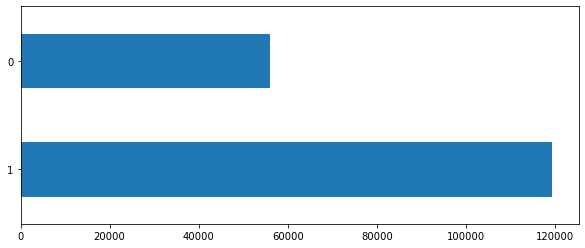

In [10]:
train_label = train['label'].value_counts()
train_label.plot(kind='barh', figsize=(10,4), fontsize=10);

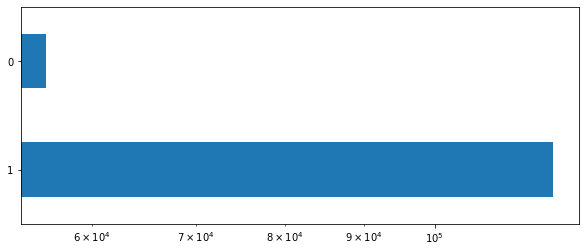

In [11]:
# logarithmic scale
train_label.plot(kind='barh', logx=True, figsize=(10,4), fontsize=10);

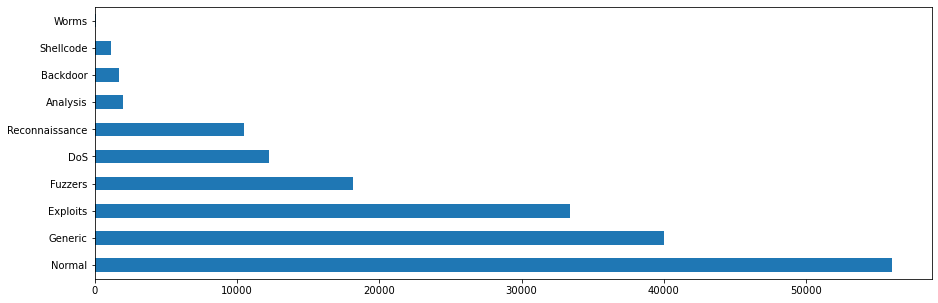

In [12]:
train_attack_cats = train['attack_cat'].value_counts()
train_attack_cats.plot(kind='barh', figsize=(15,5), fontsize=10);

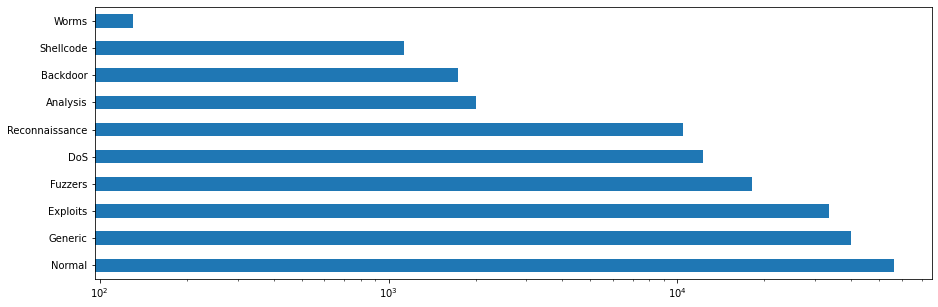

In [13]:
# the same plots as before in a logarithmic representation:
train_attack_cats.plot(kind='barh', logx=True, figsize=(15,5), fontsize=10);

One obvious observation is that the classes are tremendously imbalanced. For instance, the `Worms` class is smaller than the `Exploits` class. If we ignore this class imbalance and use the training data as is, there is a chance that the model will learn a lot more about, e.g., the `Normal` and the `Generic` classes compared to the `Worms` and `Shellcode` classes, which can result in an undesirable bias in the classifier. 
The same can be said for the binary classification problem. 

Now, let's take a look at some data. Data visualization provides many additional techniques for viewing data through graphical means. These can help in identifying relations, trends, and biases "hidden" in unstructured data sets. 

C:\Users\Francesco\AppData\Local\Temp\ipykernel_6716\3080312487.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (14, 3))


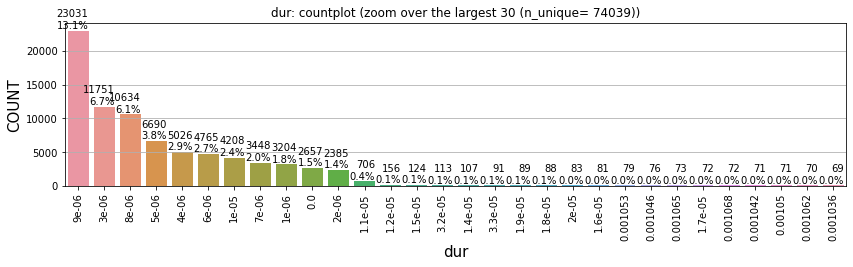

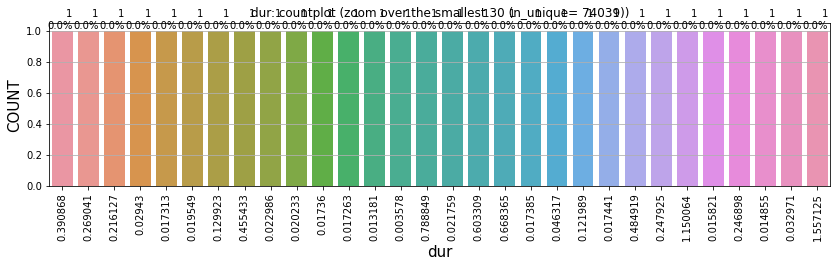

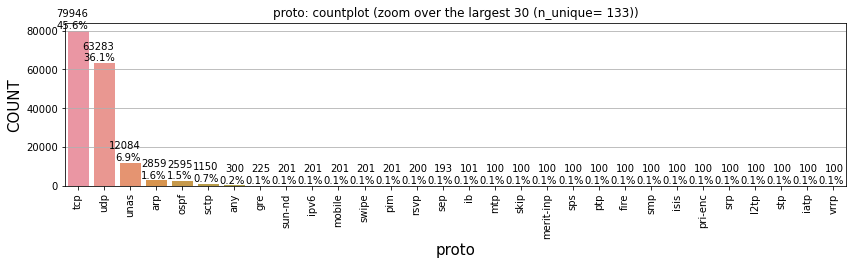

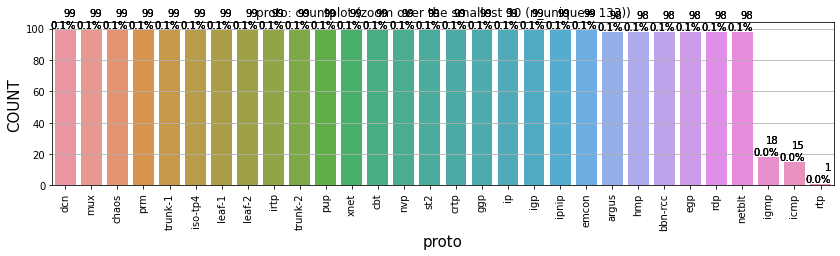

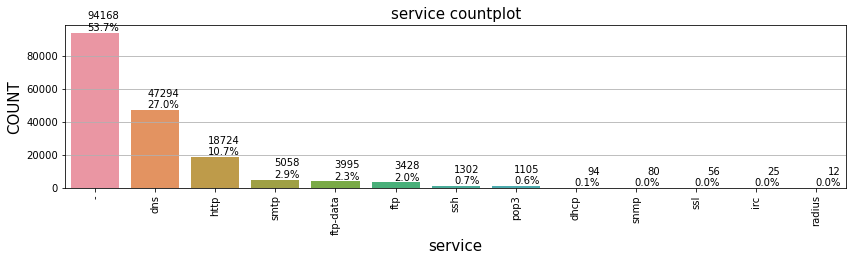

...

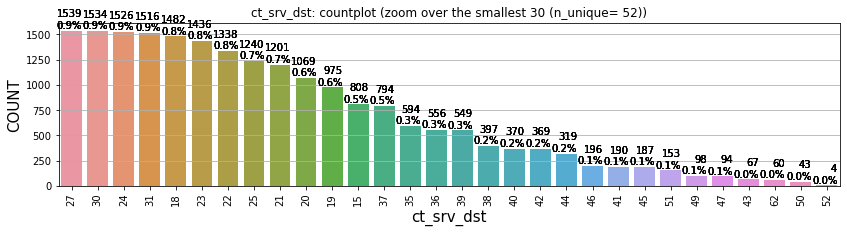

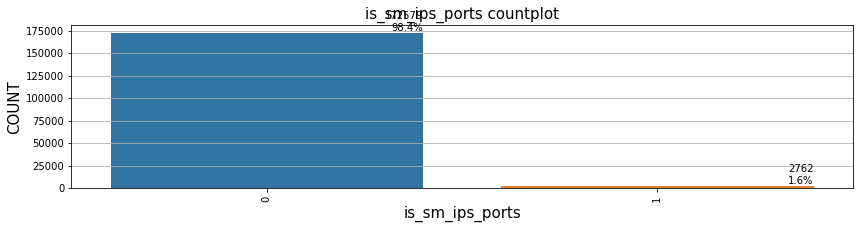

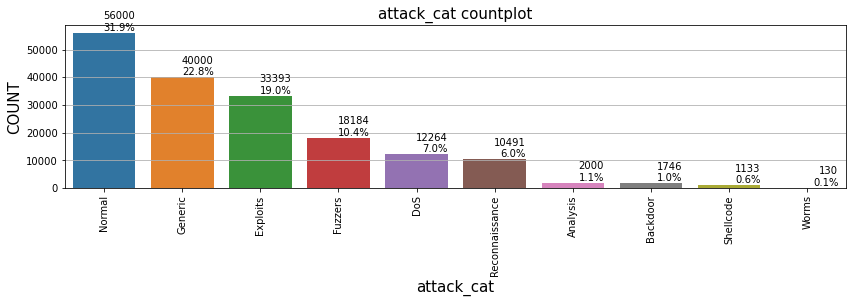

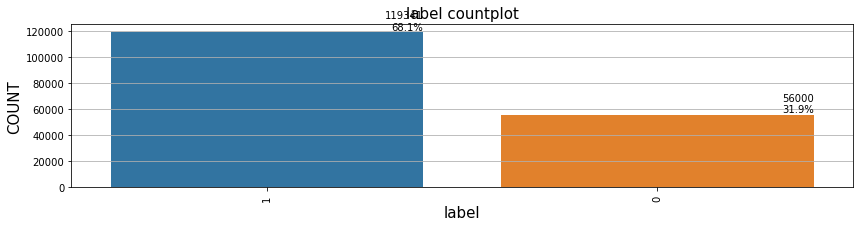

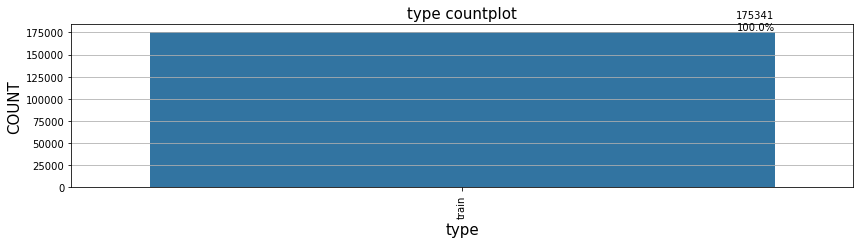

In [14]:
df_to_plot = train.copy().drop(['id'], axis=1) # useless
df_columns = df_to_plot.columns

for i, var in enumerate(df_columns):
    max_largest = 30

    largest = min(max_largest, df_to_plot[var].nunique())
    n_nunique_var = df_to_plot[var].nunique()
    tot = len(df_to_plot[var])
    n_null = df_to_plot[var].isnull().sum() 

    plt.figure(figsize = (14, 3))
    ax = sns.countplot(x=var, order=df_to_plot[var].value_counts().iloc[:largest].index, data=df_to_plot)
    plt.xticks(rotation=90, fontsize=10)
    plt.yticks(fontsize = 10)
    plt.xlabel(var, fontsize = 15)
    plt.ylabel('COUNT', fontsize = 15)

    if max_largest == largest:
        plt.title(f'{var}: countplot (zoom over the largest {largest} (n_unique= {n_nunique_var}))', fontsize = 12)
    else:
        plt.title(f'{var} countplot', fontsize = 15)

    plt.grid(axis = 'y')

    for p in ax.patches:
        percentage = '{:.0f}\n{:.1f}%'.format(p.get_height(), 100 * p.get_height() / len(df_to_plot[var]))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax.annotate(percentage, (x,y), ha='right', va='bottom')

    if max_largest == largest: 
        plt.figure(figsize = (14, 3))
        ax_lower = sns.countplot(x = var, order = df_to_plot[var].value_counts().iloc[-largest:].index, data = df_to_plot)
        plt.xticks(rotation = 90, fontsize = 10)
        plt.yticks(fontsize = 10)
        plt.xlabel(var, fontsize = 15)
        plt.ylabel('COUNT', fontsize = 15)
        plt.title(f'{var}: countplot (zoom over the smallest {largest} (n_unique= {n_nunique_var}))', fontsize = 12)
        plt.grid(axis='y')

    for p in ax_lower.patches:
        percentage = '{:.0f}\n{:.1f}%'.format(p.get_height(), 100 * p.get_height() / len(df_to_plot[var]))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax_lower.annotate(percentage, (x,y), ha='right', va='bottom')

Some comments on the distributions: 

- `dur`: skwed to the right, big range of values
- `proto`: skwed to the right, mainly tcp and udp
- `service`: skwed, '-' means else
- `state`: skwed
- `spkts`: skwed, medium range of values 
- `dpkts`: similar distribution of spkts 
- `sbytes`: similar to the distribution above 
- `dbytes`: similar to the distribution above
- `rate`: skwed, big range of values 
- `sttl`: skwed 
- `dttl`: skwed 
- `sload`: fairly balanced in the distribution 
- `dload`: mostly skwed to the right, 0 is the main value 
- `sloss`: similar to sent packets/bytes
- `dloss`: similar to sent received packets/bytes
- `sinpkt`: a bit skwed
- `dinpkt`: skwed  
- `sjit`: mostly skwed
- `djit`: mostly skwed
- `swin`: mainly 0 and 255 
- `dwin`: mainly 0 and 255 
- `stcpb`: half are 0 
- `dtcpb`: half are 0 
- `tcprtt`: half are 0 
- `synack`: half are 0
- `ackdat`: half are 0 
- `smean`: skwed 
- `dmean`: skwed
- `trans_depth`: mostly 0 
- `response_body_len`: mostly 0 
- `ct_srv_src`: a bit skwed 
- `ct_state_ttl`: fairly distributed 
- `ct_dst_ltm`: fairly distributed 
- `ct_src_dport_ltm`: mostly 1
- `ct_dst_sport_ltm`: mostly 1 
- `ct_dst_src_ltm`: a bit skwed 
- `is_ftp_login`: mostly 0
- `ct_ftp_cmd`: mostly 0 
- `ct_flw_http_mthd`: mostly 0
- `ct_src_ltm`: fairly distributed
- `ct_src_dst`: a bit skwed
- `is_sm_ips_port`: mostly 0 

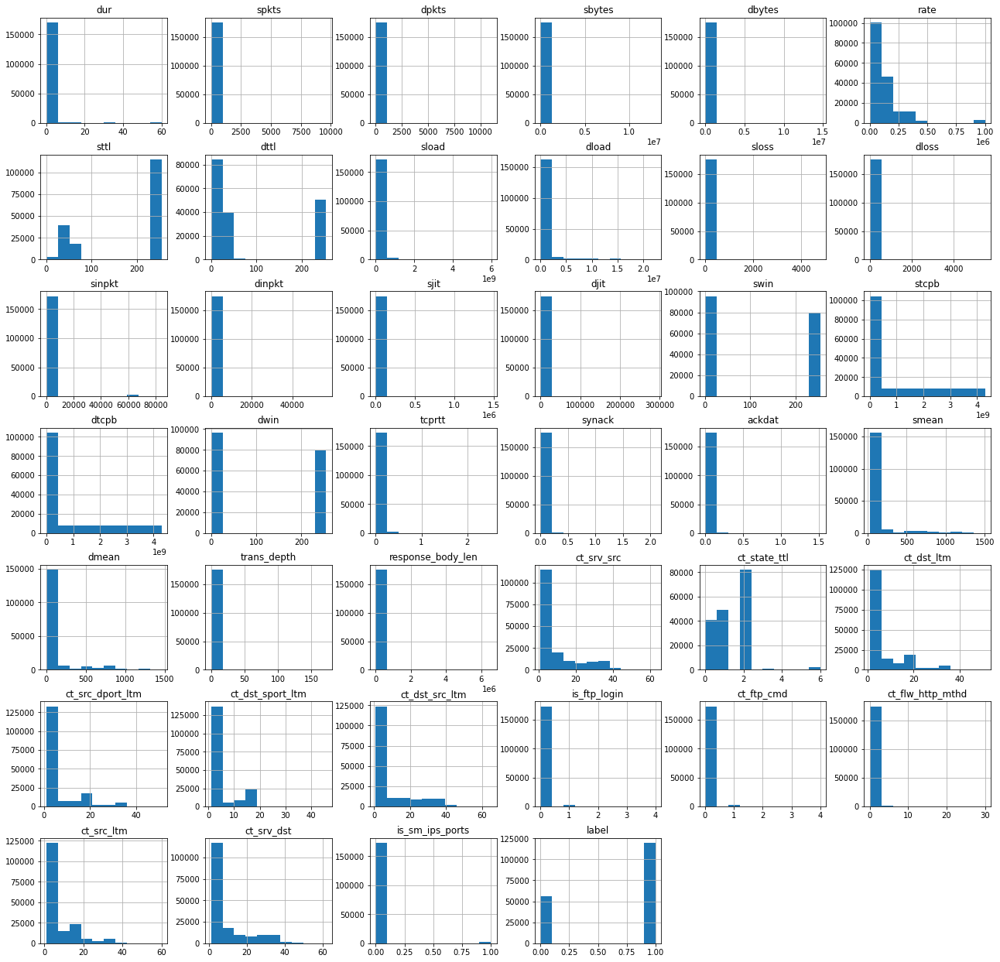

In [15]:
# all together
df_to_plot.hist(figsize=(22,22));

## 1.2 Datatypes understanding

In [16]:
# data types of each column, mixed types are stored with the `object` dtype
df_total.dtypes 

id                     int32
dur                  float32
proto                 object
service               object
state                 object
spkts                  int16
dpkts                  int16
sbytes                 int32
dbytes                 int32
rate                 float32
sttl                   int16
dttl                   int16
sload                float32
dload                float32
sloss                  int16
dloss                  int16
sinpkt               float32
dinpkt               float32
sjit                 float32
djit                 float32
swin                   int16
stcpb                  int64
dtcpb                  int64
dwin                   int16
tcprtt               float32
synack               float32
ackdat               float32
smean                  int16
dmean                  int16
trans_depth            int16
response_body_len      int32
ct_srv_src              int8
ct_state_ttl            int8
ct_dst_ltm              int8
ct_src_dport_l

From the previous output, the describe output and the specification of the dataset in the documentation, we can see the presence of:
- 3 categorical features (*proto*, *service*, *state*)
- 2 (asymmetric) binary features (*is_ftp_login*, *is_sm_ips_ports*)
- 2 possible target features (*attack_cat*, *label*)
- the *others* are numerical features (float or int)

## 1.3 An insight on specific attacks
This paragraph it is not aimed at a deep data visualization analysis of the dataset but is useful to understand some insights.  

In [17]:
fuzzers_df = df_total[df_total['attack_cat'] == 'Fuzzers' ]
fuzzers_df.describe(include='all')

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type
count,24246.000000,24246.000000,24246,24246,24246,24246.000000,24246.000000,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,2.424600e+04,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,2.424600e+04,24246.000000,24246.000000,2.424600e+04,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.0,24246,24246.0,24246
unique,NaN,NaN,129,4,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,2
top,NaN,NaN,tcp,-,FIN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fuzzers,NaN,train
freq,NaN,NaN,15474,21980,15461,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24246,NaN,18184
mean,81532.686175,2.673930,NaN,NaN,NaN,13.764827,6.095686,6.764303e+03,518.772127,67267.070312,253.407944,160.900272,1.276859e+08,3.221342e+03,3.863648,1.152644,410.948029,318.406891,2.159783e+04,846.070251,162.743133,1.368714e+09,1.365963e+09,162.743133,0.098788,0.052170,0.046617,238.826198,38.831601,0.048462,2.734224,6.124557,1.421224,2.527345,2.133548,1.416399,4.412975,0.005857,0.005857,0.063309,3.376557,5.436691,0.0,NaN,1.0,NaN
std,37362.040062,9.441679,NaN,NaN,NaN,34.371893,8.298022,4.294158e+04,5693.725260,142351.781250,11.099163,121.015686,3.599787e+08,1.521265e+04,16.560744,2.522197,2595.423096,1603.147217,1.067143e+05,4766.822754,122.534856,1.427848e+09,1.426568e+09,122.534856,0.088006,0.048489,0.044075,320.664138,50.262911,0.214744,201.497561,6.059497,0.747720,3.135934,2.248636,1.174733,5.422104,0.078438,0.078438,0.344525,4.401981,5.842210,0.0,NaN,0.0,NaN
min,267.000000,0.000000,NaN,NaN,NaN,1.000000,0.000000,2.400000e+01,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,NaN,1.0,NaN
25%,53451.250000,0.000010,NaN,NaN,NaN,2.000000,0.000000,5.320000e+02,0.000000,19.497195,254.000000,0.000000,6.676498e+03,0.000000e+00,0.000000,0.000000,0.010000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,57.000000,0.000000,0.000000,0.000000,3.000000,1.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,1.000000,2.000000,0.0,NaN,1.0,NaN
50%,72993.500000,0.589509,NaN,NaN,NaN,10.000000,6.000000,8.200000e+02,268.000000,33.898212,254.000000,252.000000,1.769602e+04,2.492026e+03,2.000000,1.000000,49.383499,69.468430,2.664123e+03,105.965721,255.000000,9.455292e+08,9.168295e+08,255.000000,0.108917,0.055150,0.048531,91.000000,44.000000,0.000000,0.000000,4.000000,1.000000,2.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,2.000000,4.000000,0.0,NaN,1.0,NaN
75%,104970.250000,1.080940,NaN,NaN,NaN,12.000000,8.000000,1.494000e+03,682.000000,100000.000000,254.000000,252.000000,8.000000e+07,4.427268e+03,3.000000,2.000000,92.156906,118.691534,4.967546e+03,184.254883,255.000000,2.601297e+09,2.603236e+09,255.000000,0.163411,0.085737,0.076118,252.000000,54.000000,0.000000,0.000000,7.000000,2.000000,2.000000,

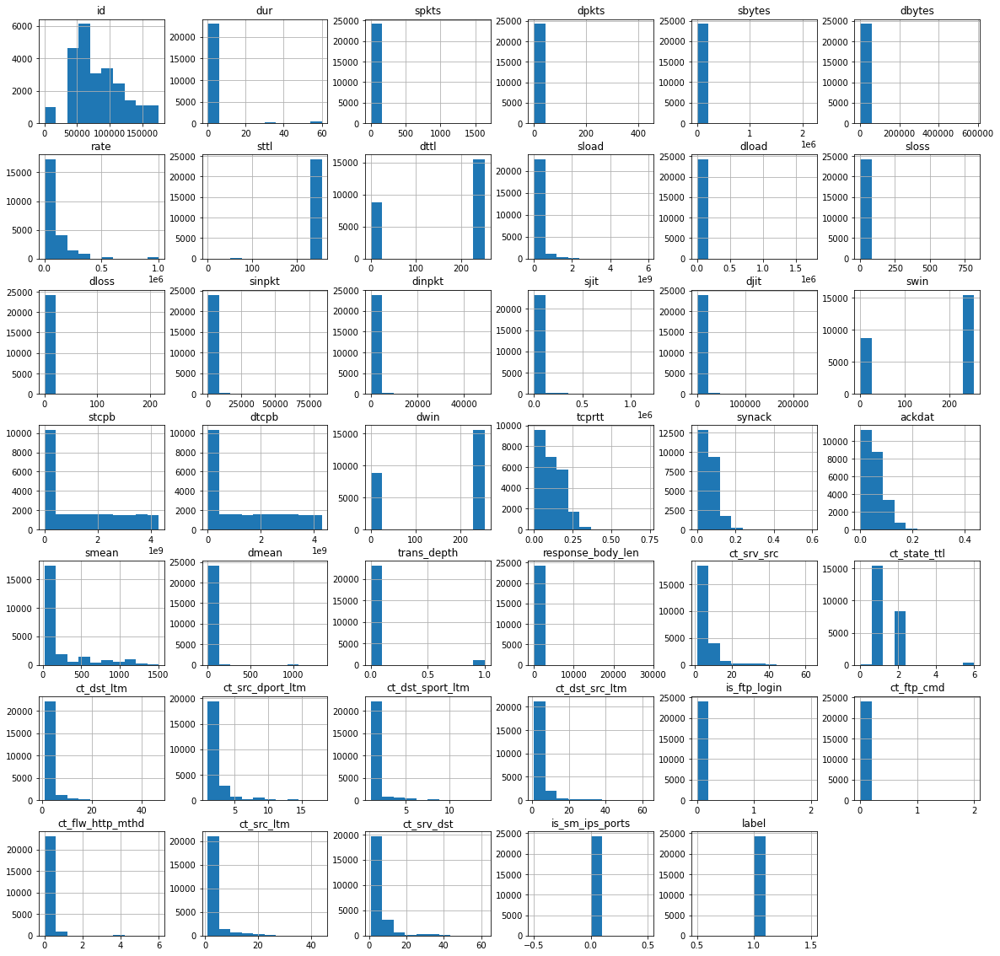

In [18]:
fuzzers_df.hist(figsize=(20,20));

With the general distributions we can spot some differences, like in the values taken in sttl and dttl. But also, for example, the maximum values of dur, spkts, dkpts, sbytes, dbytes, and a lot more. 

If we analyse the tendency of two attributes like *is_ftp_login* and *dur* we can, for example, spot that attacks belonging to the `Exploit` category are characterized by a higher value of the former feature (note that the attribute is binary but assumes values higher than 1, data cleaning is a step performed ahead), meanwhile no insights come from the latter one. 

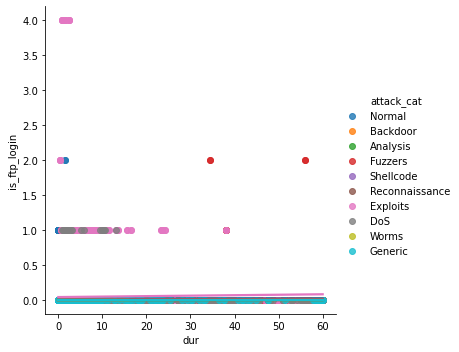

In [19]:
g = sns.lmplot(x="dur", y="is_ftp_login", data=df_total, hue="attack_cat")

With regard to the binary problem and the *attack* label:

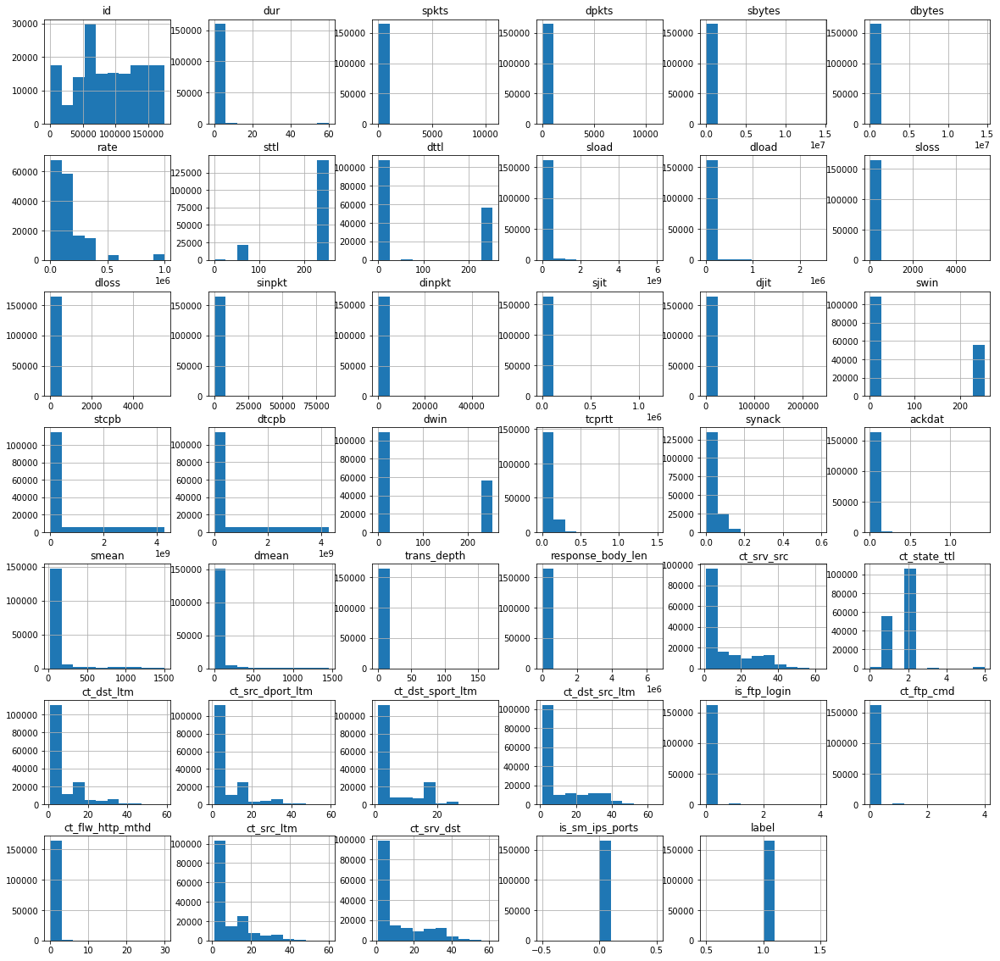

In [20]:
attacks_df = df_total[df_total['label'] == 1]
# attacks_df.describe(include='all')
attacks_df.hist(figsize=(20,20));

We can spot a little difference in the *swin* data distribution, different amplitudes in *stcpb* and *dtcpb*. But also different shapes for *tcprtt*, *synack* and *ackdat*, and so on and so forth. 

Take a look at categorical values for different attack categories:

In [21]:
# pip install -U kaleido

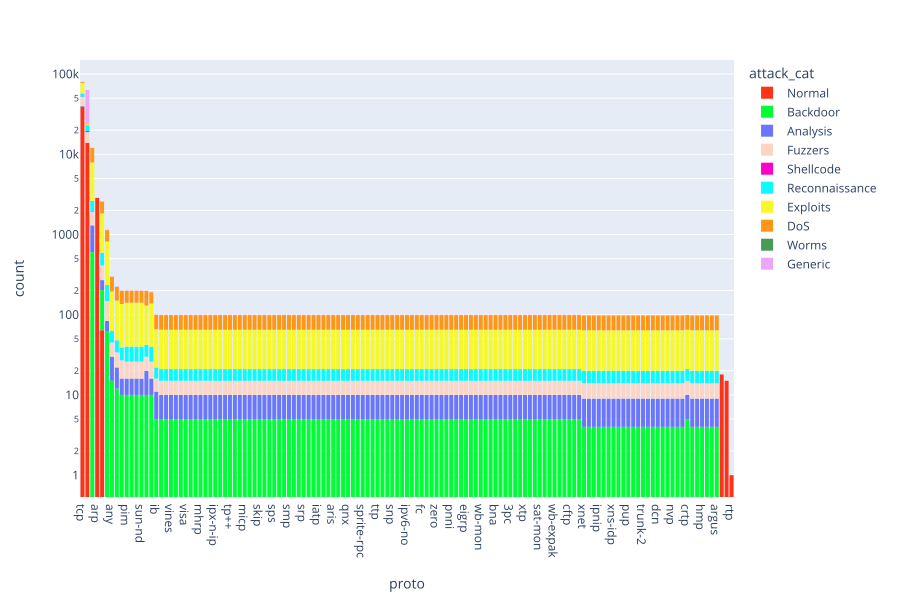

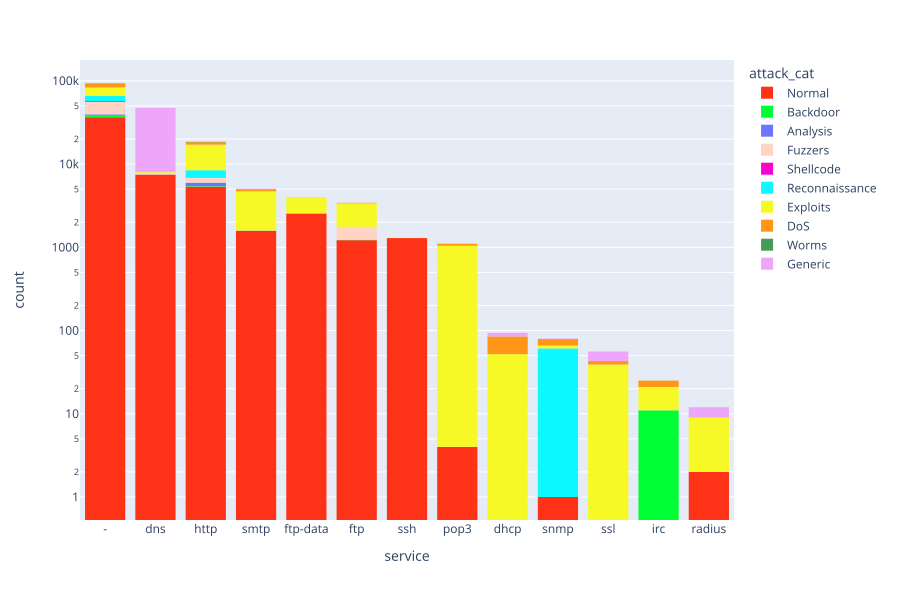

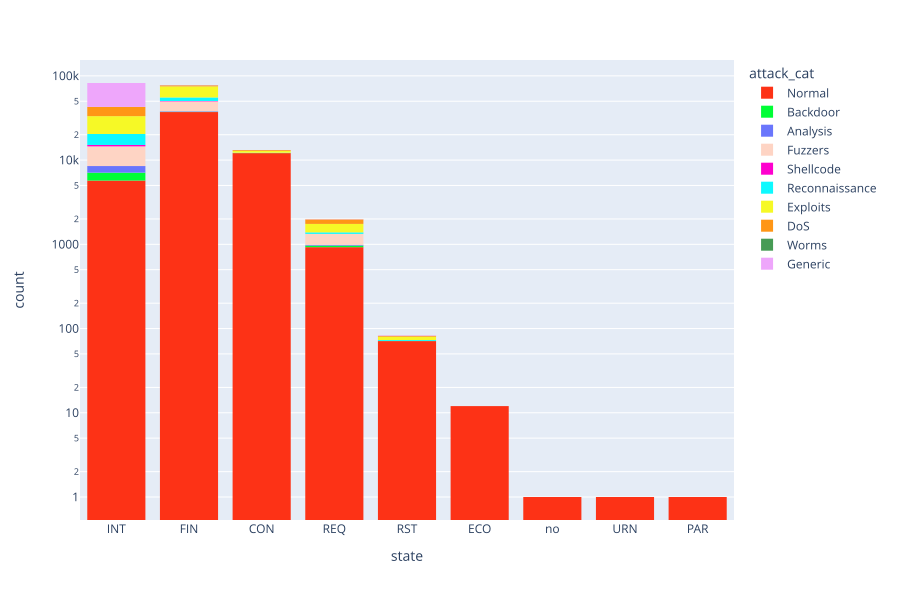

In [22]:
# multiclass
nominal_cols = train.select_dtypes(include='object').columns
for feature in nominal_cols:
    if feature != 'attack_cat' and feature != 'type':
        fig = px.histogram(train, x=feature, log_y=True, color="attack_cat", color_discrete_sequence=px.colors.qualitative.Light24)
        fig.update_layout(xaxis={'categoryorder':'total descending'})
        fig.show(renderer="svg", width=900, height=600)

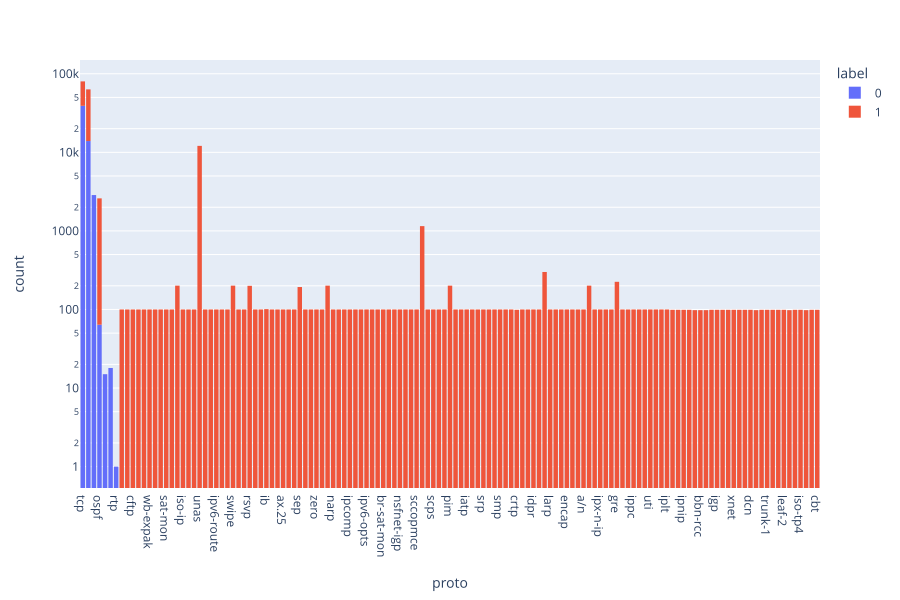

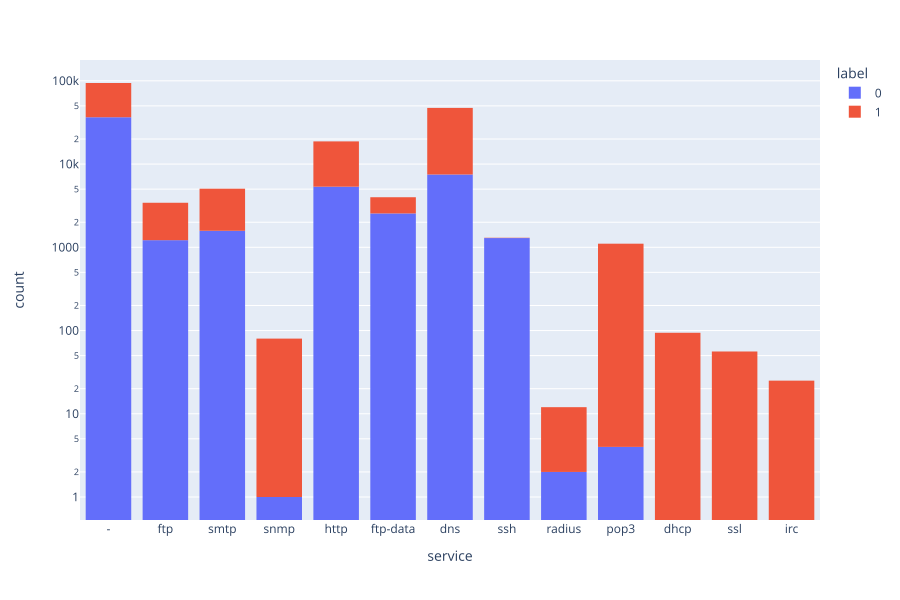

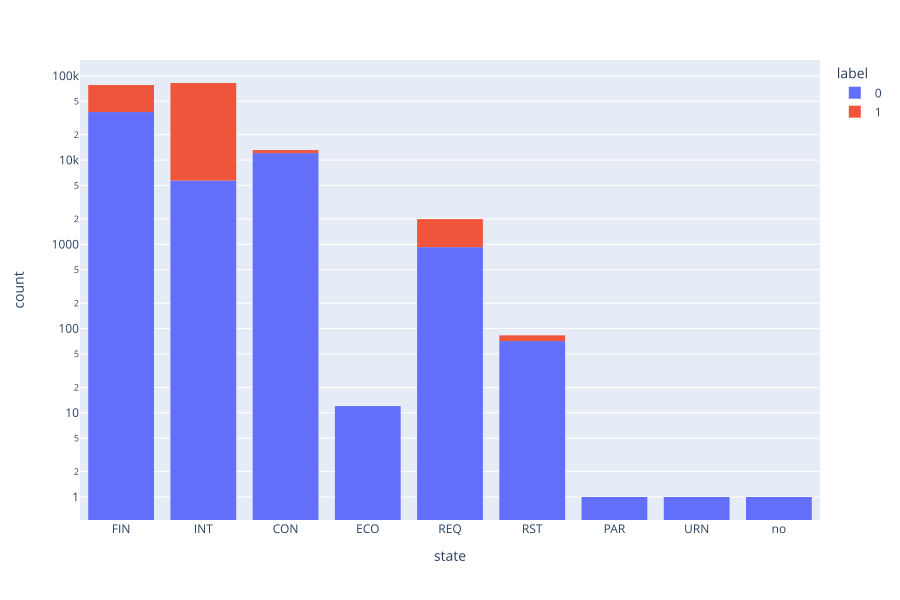

In [23]:
# binary class
for feature in nominal_cols:
    if feature != 'attack_cat' and feature != 'type':
        fig = px.histogram(train, x=feature, log_y=True, color="label")
        fig.show(renderer="svg", width=900, height=600)

For example, most of the attacks have a 'particular' protocol type.

Let's do the same for the numeric attributes (only the binary case):

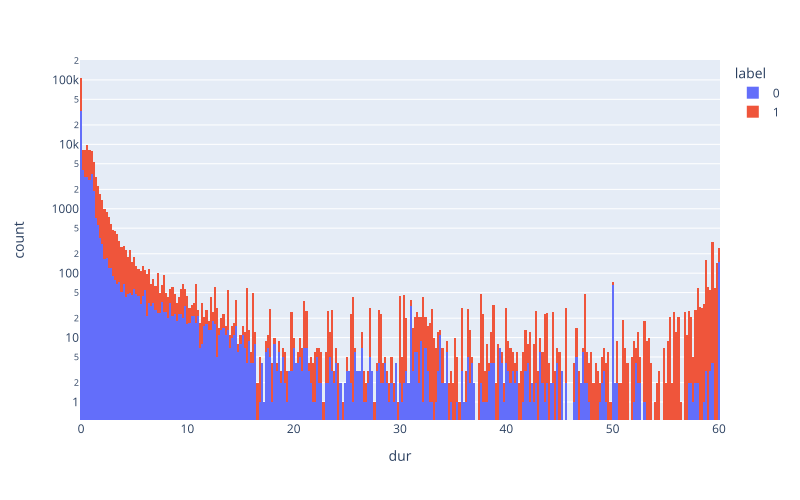

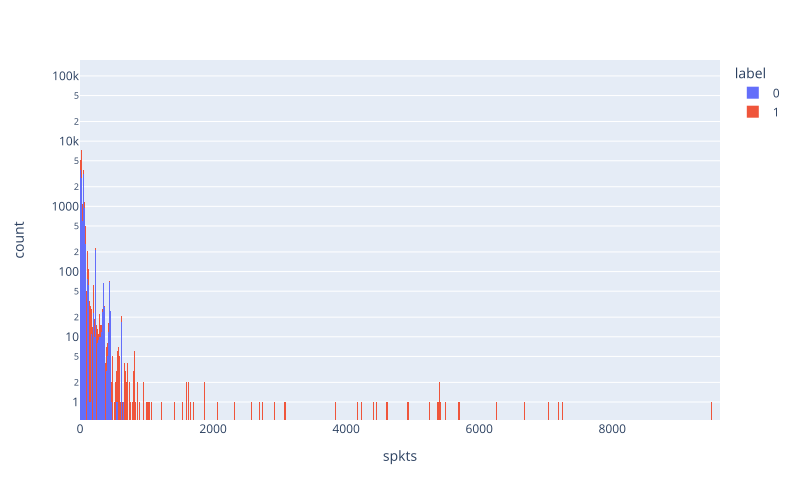

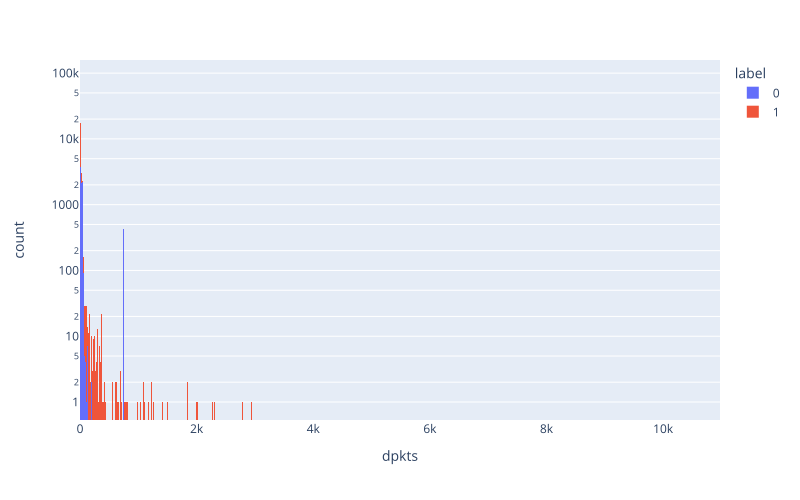

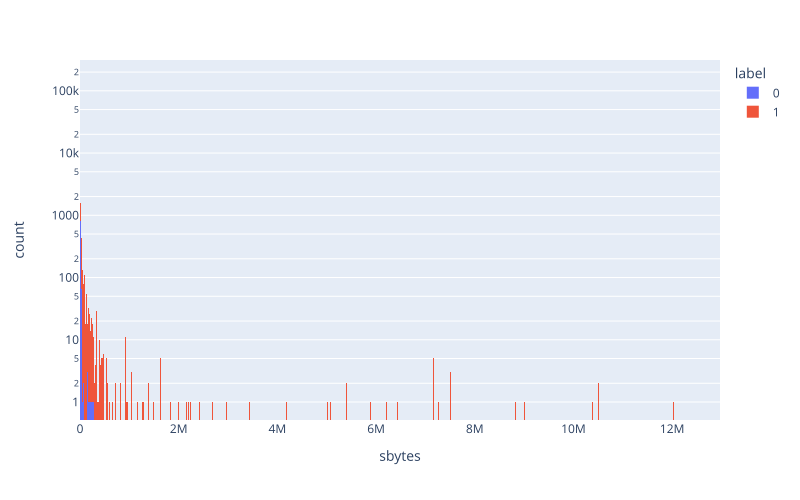

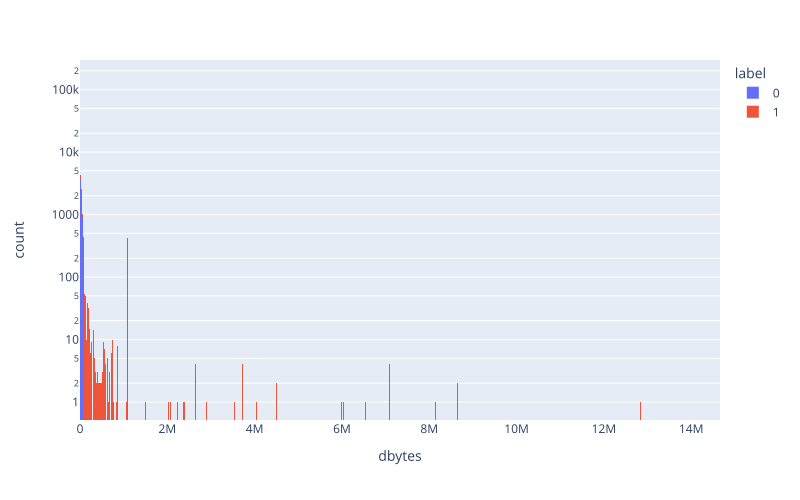

...

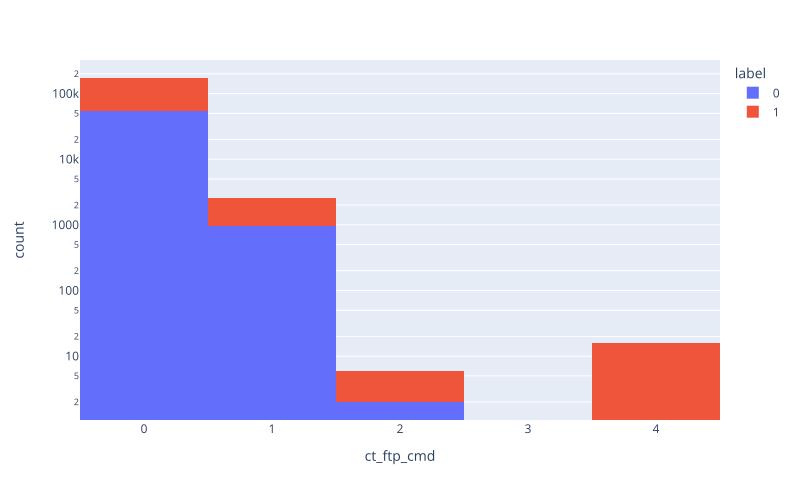

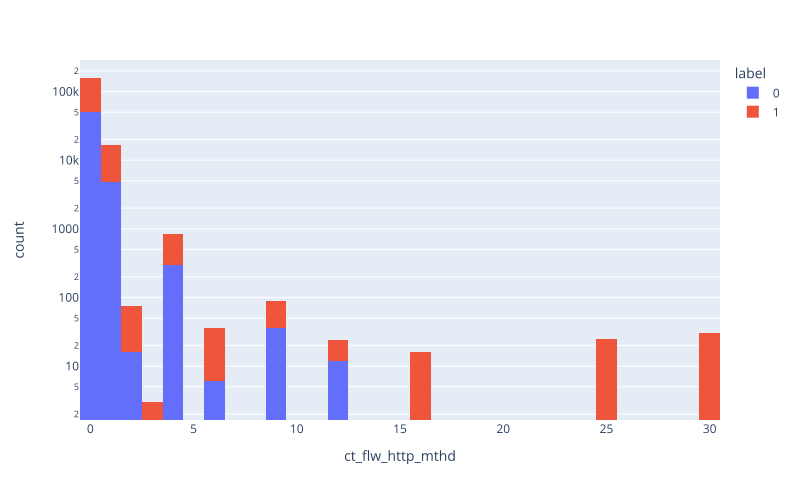

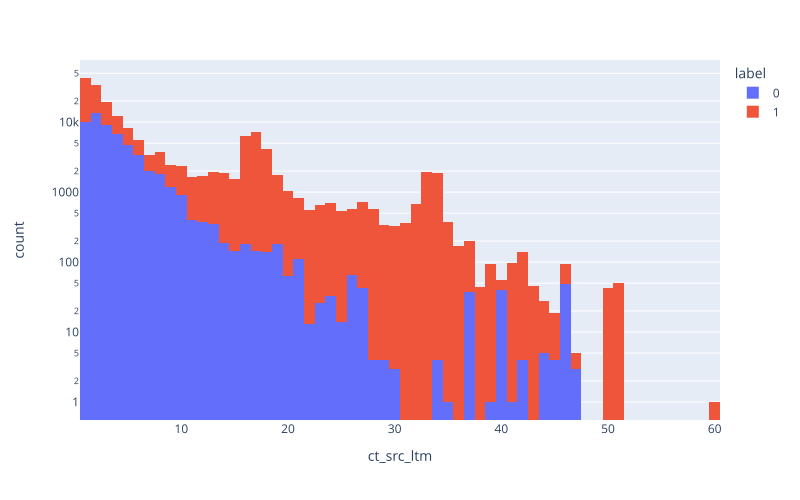

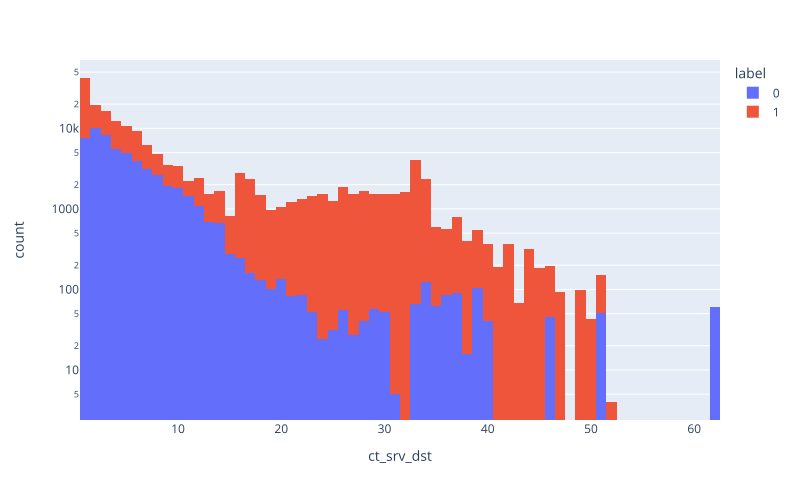

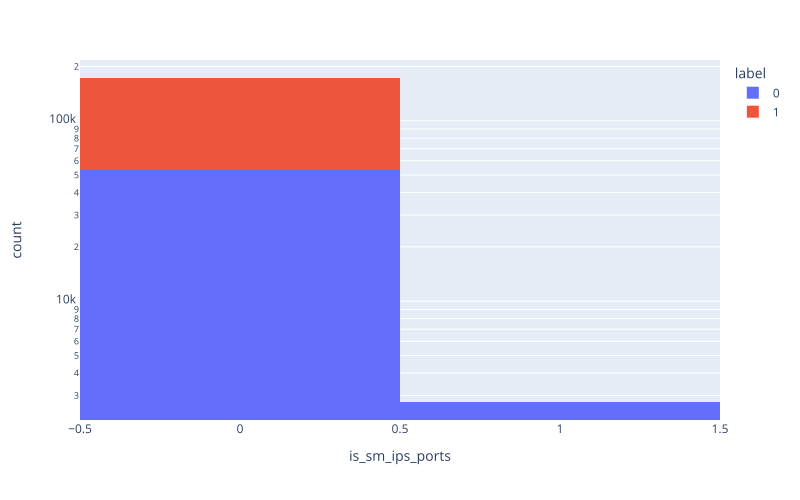

In [24]:
numeric_cols = train.select_dtypes(exclude='object').columns
for feature in numeric_cols:
    if feature != 'id' and feature != 'label':
        fig = px.histogram(train, x=feature, log_y=True, color="label")
        fig.show(renderer="svg", width=800, height=500)

In general, attacks have higher distributions w.r.t. non-attack ones. 

# 2. Data cleaning

The data cleaning phase is applied both to the training and the test set. It is an important phase because data quality has an high impact on the precision and the accuracy of the machine learning models. It is important to manage both the sets in the same manner to gurantee that the models will be evaluated equally and in a reliable manner. 


Data in real word is dirty. The may be:
- incomplete (missing values)
- noisy (containing noise, errors, outliers)
- inconsitent (containing dicrepancies)
- intentional 

Some utility variables for different feature types:

In [25]:
# retrieve features based on their types
col_names = np.array(df_total.columns)
nominal_idx = [2, 3, 4] # indexes of nominal features
binary_idx =  [37, 42] # indexes of binary features
target_idx = [43, 44, 45] # attack category, label and utility column for splitting
numeric_idx = list(set(range(43)).difference(nominal_idx).difference(binary_idx).difference(target_idx)) # indexes of numerical features


nominal_cols = col_names[nominal_idx].tolist()
binary_cols = col_names[binary_idx].tolist()
target_cols = col_names[target_idx].tolist()
numeric_cols = col_names[numeric_idx].tolist()

In [26]:
print("Check on columns assignment:\n")
print(f"nominal_cols = {nominal_cols}\n")
print(f"binary_cols  = {binary_cols}\n")
print(f"target_cols  = {target_cols}\n")
print(f"numeric_cols = {numeric_cols}\n")

Check on columns assignment:

nominal_cols = ['proto', 'service', 'state']

binary_cols  = ['is_ftp_login', 'is_sm_ips_ports']

target_cols  = ['attack_cat', 'label', 'type']

numeric_cols = ['id', 'dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm', 'ct_srv_dst']



## 2.1 Drop useless columns
Remove useless *id* column:

In [27]:
df_total.drop(['id'], axis=1, inplace=True)

## 2.2 Missing values check

In [28]:
df_total.isnull().values.any()

False

## 2.3 Consistency checking

Let's take a look at the *binary* features (index and column transposition is used). By definition, all of these features should have a min of 0.0 and a max of 1.0

In [29]:
df_total[binary_cols].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
is_ftp_login,257673.0,0.012819,0.116091,0.0,0.0,0.0,0.0,4.0
is_sm_ips_ports,257673.0,0.014274,0.118618,0.0,0.0,0.0,0.0,1.0


The `is_ftp_login` has a maximum value of 4

In [30]:
df_total.groupby(['is_ftp_login']).size()

is_ftp_login
0    254428
1      3219
2        10
4        16
dtype: int64

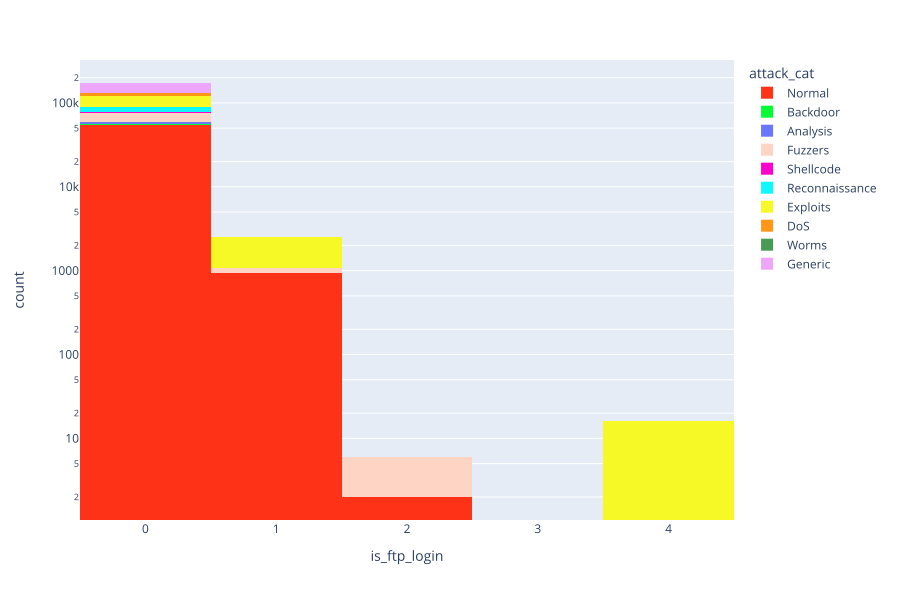

In [31]:
fig = px.histogram(train, x='is_ftp_login', log_y=True, color="attack_cat", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_layout(xaxis={'categoryorder':'total ascending'})
fig.show(renderer="svg", width=900, height=600)

TO DO this can be inferred with some more precise method

In [32]:
# Let's fix this discrepancy, from the picture above we can assume:
# is_ftp_login == 2 ==> 0 
# is_ftp_login == 4 ==> 1
df_total['is_ftp_login'].replace(2, 0, inplace=True)
df_total['is_ftp_login'].replace(4, 1, inplace=True)
df_total.groupby(['is_ftp_login']).size()

is_ftp_login
0    254438
1      3235
dtype: int64

## 2.4 Checking for single-value features

In [33]:
df_total.nunique()

dur                  109945
proto                   133
service                  13
state                    11
spkts                   646
dpkts                   627
sbytes                 9382
dbytes                 8653
rate                 115411
sttl                     13
dttl                      9
sload                121356
dload                116380
sloss                   490
dloss                   476
sinpkt               114102
dinpkt               110132
sjit                 116800
djit                 114673
swin                     22
stcpb                114473
dtcpb                114187
dwin                     19
tcprtt                63878
synack                57366
ackdat                53248
smean                  1377
dmean                  1362
trans_depth              14
response_body_len      2819
ct_srv_src               57
ct_state_ttl              7
ct_dst_ltm               52
ct_src_dport_ltm         52
ct_dst_sport_ltm         35
ct_dst_src_ltm      

## 2.5 Duplicates check

In [34]:
train.duplicated().sum()

0

In [35]:
test.duplicated().sum()

0

## 2.5 Smoothing, Clamping and Log Transform

In [36]:
df_numeric = df_total.select_dtypes(include=[np.number])
for feature in df_numeric:
    if df_numeric[feature].max()>10*df_numeric[feature].median() and df_numeric[feature].max()>10 :
        df_total[feature] = np.where(df_total[feature] < df_total[feature].quantile(0.95), df_total[feature], df_total[feature].quantile(0.95))

In [37]:
df_numeric = df_total.select_dtypes(include=[np.number])
for feature in df_numeric.columns:
    if df_numeric[feature].nunique() > 50:
        if df_numeric[feature].min() == 0:
            df_total[feature] = np.log(df_total[feature] + 1)
        else:
            df_total[feature] = np.log(df_total[feature])

## 2.6 Balance checking

In [38]:
# performed only on the training set
train['attack_cat'].unique() 

array(['Normal', 'Backdoor', 'Analysis', 'Fuzzers', 'Shellcode',
       'Reconnaissance', 'Exploits', 'DoS', 'Worms', 'Generic'],
      dtype=object)

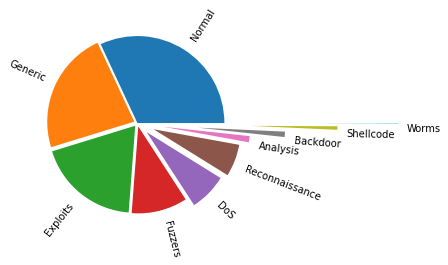

In [39]:
# multiclass problem --> imbalanced
wedges = train['attack_cat'].value_counts()
myexplode = [0, 0.04, 0.04, 0.04, 0.15, 0.2, 0.3, 0.7, 1.3, 2]
plt.pie(np.array(wedges), labels= wedges.index, explode=myexplode, rotatelabels=True)
plt.show()

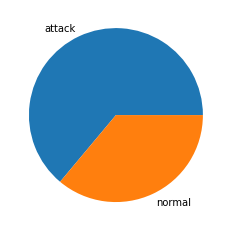

In [40]:
# binary classifiacation problem --> balanced
wedges = df_total['label'].value_counts()
plt.pie(np.array(wedges), labels= ['attack', 'normal'])
plt.show()

### 2.7 Correlation Analysis Insight


Correlation analysis it is most commonly performed on the training data. The purpose of performing correlation analysis on the training data is to identify the relationships between the independent variables (predictors) and the dependent variable (outcome). This information can then be used to inform the selection of predictors for a predictive model or to inform feature engineering efforts. 

<AxesSubplot:>

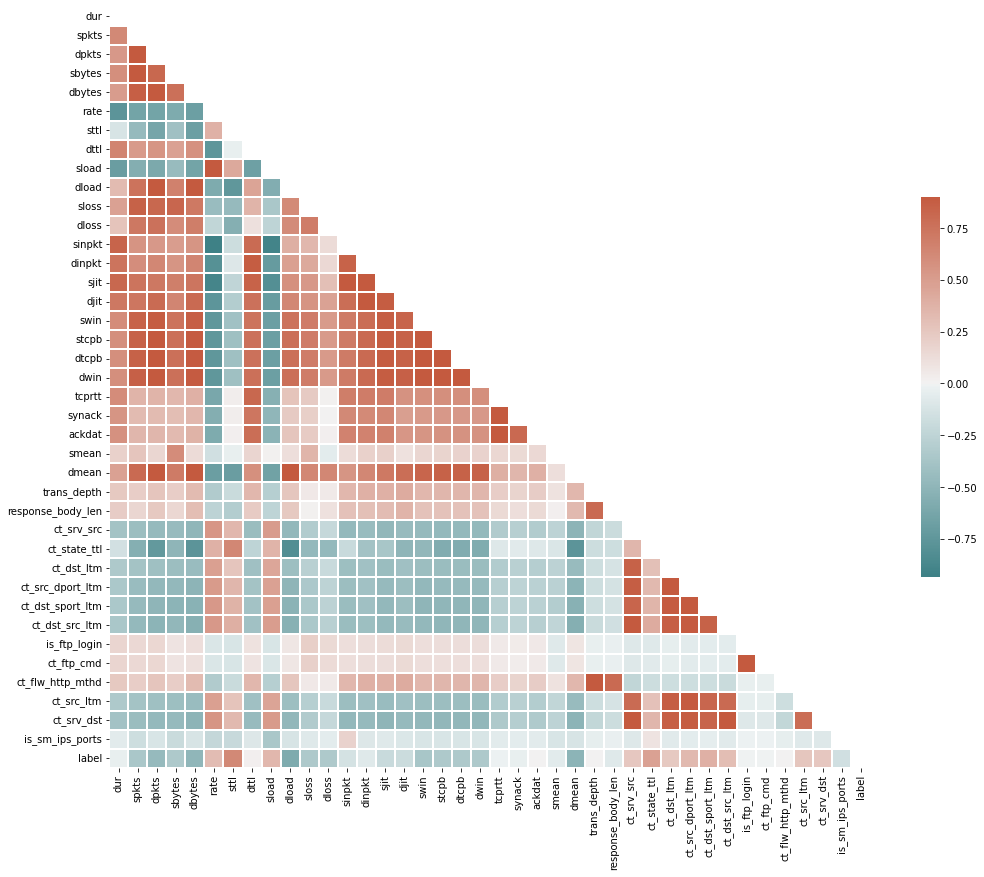

In [41]:
correlations = df_total.corr(method='pearson')

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlations, dtype=bool))
fig, ax = plt.subplots(figsize=(18,14))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(200, 20, as_cmap=True)
sns.heatmap(correlations, mask=mask, cmap=cmap, vmax=.9, center=0,
            square=True, linewidths=.1, cbar_kws={"shrink": .5})


In [42]:
def top_correlations(correlations, limit=0.95):
    columns = correlations.columns
    for i in range(correlations.shape[0]):
        for j in range(i+1, correlations.shape[0]):
            if correlations.iloc[i,j] >= limit or correlations.iloc[i,j] <= -limit:
                print(f"{columns[i]} <-> {columns[j]}  ==  {correlations.iloc[i,j]*100}")

top_correlations(correlations)

# Pearson
# limit == 0.9
# spkts <-> sbytes  ==  96.4393217155871
# spkts <-> sloss  ==  97.18594116510776
# dpkts <-> dbytes  ==  97.34453279792797
# dpkts <-> dloss  ==  97.9612084935938
# sbytes <-> sloss==  99.57715772406667
# dbytes <-> dloss  ==  99.67111338314551
# sinpkt <-> is_sm_ips_ports  ==  94.21206233324895
# swin <-> dwin  ==  98.04584289136497
# tcprtt <-> synack  ==  94.30527537645945
# tcprtt <-> ackdat  ==  92.02175912501836
# ct_srv_src <-> ct_dst_src_ltm  ==  95.39519771685964
# ct_srv_src <-> ct_srv_dst  ==  97.94668130725528
# ct_dst_ltm <-> ct_src_dport_ltm  ==  96.15176986568883
# ct_dst_ltm <-> ct_src_ltm  ==  90.15817705704372
# ct_src_dport_ltm <-> ct_dst_sport_ltm  ==  90.83371617418115
# ct_src_dport_ltm <-> ct_src_ltm  ==  90.94302805367734
# ct_dst_src_ltm <-> ct_srv_dst  ==  96.03212131064117
# is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241
# ------------------------------------------------------
# limit == 0.95
# dpkts <-> dbytes  ==  97.76737002221728
# dbytes <-> dload  ==  95.09783492996641
# dbytes <-> dmean  ==  98.76156469268844
# rate <-> sload  ==  97.30769401765275
# dload <-> dmean  ==  96.52106425259068
# swin <-> stcpb  ==  97.87232735525889
# swin <-> dtcpb  ==  97.85822124027848
# swin <-> dwin  ==  98.04584289136497
# stcpb <-> dtcpb  ==  99.61466213840428
# stcpb <-> dwin  ==  99.76286485467159
# dtcpb <-> dwin  ==  99.77706791818485
# tcprtt <-> synack  ==  95.35300491978894
# trans_depth <-> ct_flw_http_mthd  ==  99.99563577287881
# ct_srv_src <-> ct_srv_dst  ==  97.68827900096507
# ct_dst_ltm <-> ct_src_dport_ltm  ==  95.02007614056207
# ct_dst_src_ltm <-> ct_srv_dst  ==  95.654660229205
# is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241

# Spearman
# limit == 0.9
# spkts <-> dpkts  ==  91.64563064808364
# spkts <-> sloss  ==  92.9289792172513
# spkts <-> dloss  ==  91.15810431436245
# dpkts <-> dbytes  ==  98.94239885330065
# dpkts <-> dload  ==  90.2105049332341
# dpkts <-> sloss  ==  92.64790033072707
# dpkts <-> dloss  ==  95.7332872819865
# dpkts <-> dwin  ==  90.70480261041583
# dpkts <-> dmean  ==  92.91055696558617
# dbytes <-> dload  ==  92.12942945361041
# dbytes <-> dloss  ==  94.76466651202257
# dbytes <-> dmean  ==  96.08834522066077
# rate <-> sload  ==  95.9916527208592
# rate <-> sinpkt  ==  -95.48540066354234
# dttl <-> dinpkt  ==  95.33030685132124
# dttl <-> tcprtt  ==  92.62628455966865
# dttl <-> synack  ==  92.60846358224677
# dttl <-> ackdat  ==  92.61058285120119
# sload <-> sinpkt  ==  -91.60490855239391
# dload <-> dmean  ==  96.3142434297067
# dload <-> ct_state_ttl  ==  -93.19769527272086
# sloss <-> dloss  ==  94.64737791140843
# sloss <-> swin  ==  93.7823512536146
# sloss <-> dwin  ==  92.78589621531286
# dloss <-> swin  ==  91.80201206008212
# dloss <-> dwin  ==  93.62121600134238
# dinpkt <-> sjit  ==  91.3852976729809
# dinpkt <-> djit  ==  93.45843461140917
# dinpkt <-> tcprtt  ==  91.58899760442519
# dinpkt <-> synack  ==  91.3984635575326
# dinpkt <-> ackdat  ==  91.50333182564867
# sjit <-> djit  ==  90.375300430896
# sjit <-> tcprtt  ==  90.32747677622767
# sjit <-> synack  ==  90.12619663638948
# sjit <-> ackdat  ==  90.11967778936297
# swin <-> stcpb  ==  91.97580135768018
# swin <-> dtcpb  ==  91.9643733373151
# swin <-> dwin  ==  98.0517974684704
# swin <-> tcprtt  ==  91.79738708672141
# swin <-> synack  ==  91.7975819710926
# swin <-> ackdat  ==  91.77828513525441
# stcpb <-> dwin  ==  93.75143500021026
# dtcpb <-> dwin  ==  93.76868122410612
# dwin <-> tcprtt  ==  93.61477766789928
# dwin <-> synack  ==  93.61541162170843
# dwin <-> ackdat  ==  93.59534274867433
# tcprtt <-> synack  ==  99.62674088699754
# tcprtt <-> ackdat  ==  99.26582235754053
# synack <-> ackdat  ==  98.17222928560732
# trans_depth <-> ct_flw_http_mthd  ==  99.9563126707127
# ct_srv_src <-> ct_srv_dst  ==  91.66724310687813
# is_ftp_login <-> ct_ftp_cmd  ==  99.80873924214644
# --------------------------------------------------------
# limit == 0.95
# dpkts <-> dbytes  ==  98.93849110465906
# dpkts <-> dloss  ==  95.74133924170964
# dbytes <-> dmean  ==  96.08103833674461
# rate <-> sload  ==  95.99403389658015
# rate <-> sinpkt  ==  -95.4574113650721
# dttl <-> dinpkt  ==  95.35437059073675
# dload <-> dmean  ==  96.33512066355334
# swin <-> dwin  ==  98.0517974684704
# tcprtt <-> synack  ==  99.62674088699754
# tcprtt <-> ackdat  ==  99.26582235754053
# synack <-> ackdat  ==  98.17222928560732
# trans_depth <-> ct_flw_http_mthd  ==  99.99563577287857
# is_ftp_login <-> ct_ftp_cmd  ==  99.80873924214644

dpkts <-> dbytes  ==  97.76737002221728
dbytes <-> dload  ==  95.09783492996641
dbytes <-> dmean  ==  98.76156469268844
rate <-> sload  ==  97.30769401765275
dload <-> dmean  ==  96.52106425259068
swin <-> stcpb  ==  97.87232735525889
swin <-> dtcpb  ==  97.85822124027848
swin <-> dwin  ==  98.04584289136497
stcpb <-> dtcpb  ==  99.61466213840428
stcpb <-> dwin  ==  99.76286485467159
dtcpb <-> dwin  ==  99.77706791818485
tcprtt <-> synack  ==  95.35300491978894
trans_depth <-> ct_flw_http_mthd  ==  99.99563577287881
ct_srv_src <-> ct_srv_dst  ==  97.68827900096507
ct_dst_ltm <-> ct_src_dport_ltm  ==  95.02007614056207
ct_dst_src_ltm <-> ct_srv_dst  ==  95.654660229205
is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241


Most correlated (and shared between the two results) features are:

* spkts, sloss
* dpkts, dbytes, dloss
* swin, dwin
* tcprtt, synack
* tcprtt, ackdat
* is_ftp_login, ct_ftp_cmd

We can easily visualize correlations in a scatter plot. In the cell below a strong positive correlations between the *dbytes* and the *dloss* features is shown. Other examples are provided below, but here the analysis is not exhaustive. 

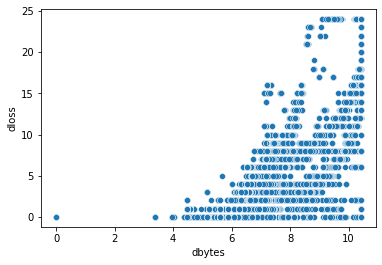

In [43]:
sns.scatterplot(x = 'dbytes', y = 'dloss', data = df_total); 

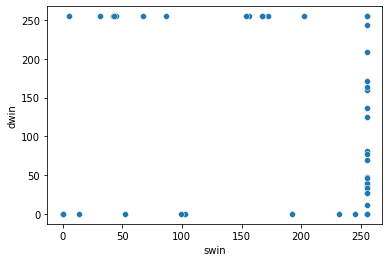

In [44]:
sns.scatterplot(x = 'swin', y = 'dwin', data = df_total);

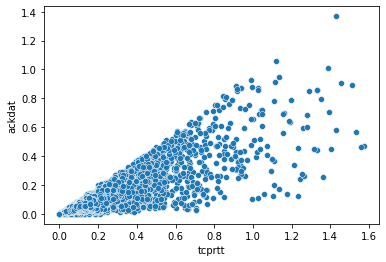

In [45]:
sns.scatterplot(x = 'tcprtt', y = 'ackdat', data = df_total);

# 3. Data Selection & Data Preparation

This is an important step in the machine learning process, we have to select a significant data subset then used to learn a model. Data selection is performed to raise the quality of machine learning models and to improve the performance of the models with new data. This could include missing or duplicate data removing, the deletion of useless features or the selection of a subset of the most important features. This step can also include the modification of the data distribution to make the model stable if the dataset is unbalanced.  

The data selection step can contain oversampling and undersampling methods. 

Oversampling consists in increasing the data quantity of a minority class within the dataset to guarantee a higher representability of that class. This step can be useful to prevent understimating machine learning model performance. 

Undersampling consists in the reduction of data quantità of a majority class within the dataset to stabilize the representation of different classes. This step can be useuful to prevent overstimating machine learning model performance.


The pre-elaboration phase is fundamental and should be executed both on the train and the test set. This phase consists in a serie of steps, like data cleaning (already performed), normalization, feature transformation and selection, that aim at improve the quality and the usability of the data to perform an automatic learning. 
It's important that both the train and the test set will be treated in the same manner, to avoid models either to be disadvantaged or to introduce inconsistencies. For example, if normalization is performed only on the train set, but not on the test set, test set values could not be represented correcly and negatively affect the model evaluation. 


TO DO oversampling, under sampling, e quindi balancing si fanno qui

# 3.1 Data Preparation

In [46]:
def create_count_df(col, data=df_total):
    df = pd.DataFrame(data[col].value_counts().reset_index().values, columns = [col, 'count'])
    df['percent'] = df['count'].values*100/data.shape[0]
    return df.sort_values(by='percent', ascending=False)

def corr(col1, col2='label', df=df_total):
    return pd.concat([df[col1], df[col2]], axis=1).corr().iloc[0,1]

### State

In [47]:
col = 'state'
# create_count_df(col, train) # to set the row below
df_total.loc[~df_total[col].isin(['FIN', 'INT', 'CON', 'REQ', 'RST']), col] = 'others'
create_count_df(col)

,state,count,percent
0,FIN,117164,45.470034
1,INT,116438,45.188281
2,CON,20134,7.813779
3,REQ,3833,1.487544
4,RST,84,0.032599
5,others,20,0.007762


### is_sm_ips_ports

C:\Users\Francesco\anaconda3\lib\site-packages\seaborn\axisgrid.py:156: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



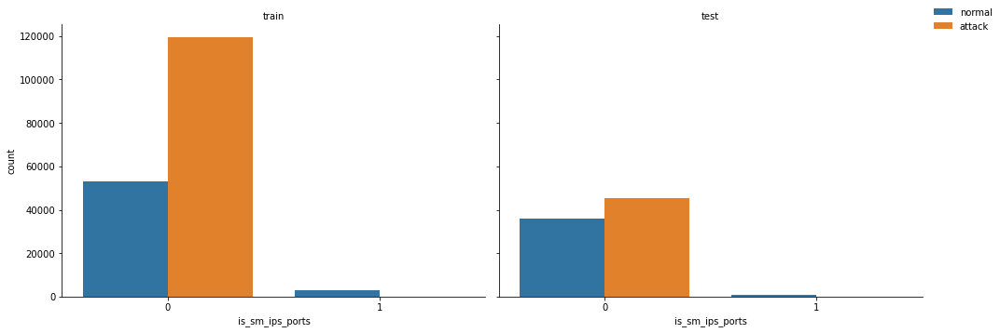

In [48]:
# is_sm_ips_ports, if it is 1 the connection is always normal
ax = sns.catplot(x='is_sm_ips_ports', hue="label", col="type", data=df_total, kind="count", height=5, legend=False, aspect=1.4)
ax.set_titles("{col_name}")
ax.add_legend(loc='upper right', labels=['normal','attack'])
plt.show(ax)

# TO DO le cose qui sotto sono ridondanti (log)

In [50]:
# df_total.drop(['sbytes', 'dbytes'], axis=1, inplace=True)

### smean & dmean

-0.0671864719700673 -0.5139070893491922 -0.06631920561325404 -0.5101996122103496


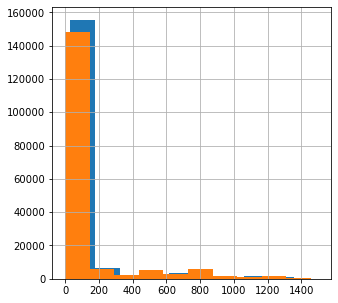

In [37]:
# the distributions are skewed to the left
train['smean'].hist(figsize=(5,5));
train['dmean'].hist(figsize=(5,5));
# we can drop smean and dmean after this computation
df_total['smean_log'] = df_total['smean'].apply(np.log1p)
df_total['dmean_log'] = df_total['dmean'].apply(np.log1p)
# we obtain a better correlation
print(corr('smean'), corr('dmean'), corr('smean_log'), corr('dmean_log'))

### spkts & dpkts

In [38]:
# also these features are skewed, drop them
df_total['spkts_log'] = df_total['spkts'].apply(np.log1p)
df_total['dpkts_log'] = df_total['dpkts'].apply(np.log1p)
print(corr('spkts'), corr('dpkts'), corr('spkts_log'), corr('dpkts_log'))

-0.35831740659051636 -0.46160125697656135 -0.34160931266498423 -0.47433262895791795


### sloss & dloss

In [39]:
df_total['sloss_log'] = df_total['sloss'].apply(np.log1p)
df_total['dloss_log'] = df_total['dloss'].apply(np.log1p)
print(corr('sloss'), corr('dloss'), corr('sloss_log'), corr('dloss_log'))

-0.3353937603143982 -0.34010352864809335 -0.3846237969529198 -0.3901697649655583


### stcpb & dtcpb

In [40]:
df_total['stcpb_log'] = df_total['stcpb'].apply(np.log1p)
df_total['dtcpb_log'] = df_total['dtcpb'].apply(np.log1p)
print(corr('stcpb'), corr('dtcpb'), corr('stcpb_log'), corr('dtcpb_log'))

-0.33899768755626575 -0.33836798055858464 -0.3395149825993979 -0.3391822630293557


### sinpkt & dinpkt

In [55]:
# sinpkt is highly correlated with is_sm_ips_ports, will dropping one of them benefit? TO DO check
df_total['sinpkt_log'] = df_total['sinpkt'].apply(np.log1p)
df_total['dinpkt_log'] = df_total['dinpkt'].apply(np.log1p)
print(corr('sinpkt'), corr('dinpkt'), corr('sinpkt_log'), corr('dinpkt_log'))

-0.13733517508533855 -0.07532955005161589 -0.1880120805985331 -0.12868708507007195


### sload & dload

In [56]:
df_total['sload_log'] = df_total['sload'].apply(np.log1p)
df_total['dload_log'] = df_total['dload'].apply(np.log1p)
print(corr('sload'), corr('dload'), corr('sload_log'), corr('dload_log'))

0.3421236563423625 -0.5897879773445802 0.2847932015407168 -0.5382399548992074


## 3.2 Feature Selection

Now the problem of dimensionality reduction is assessed. In particular it could be needed for:
- avoid the curse of dimensionality
- help in eliminating irrelevant features and reduce noise
- reduce time and space required
- allow easier visualization

This step is not always performed.

### Correlation based selection
First, we can drop the correlated features (see Correlatioin Analysis):

In [49]:
df_total.drop('sloss', axis=1, inplace=True)
df_total.drop('dbytes', axis=1, inplace=True)
df_total.drop('dwin', axis=1, inplace=True)
df_total.drop('synack', axis=1, inplace=True)
df_total.drop('ackdat', axis=1, inplace=True)
df_total.drop('is_ftp_login', axis=1, inplace=True)

### One-Hot Encoding

In [50]:
# Remove the first level of the categorical attribute, to avoid the so-called "dummy variable trap"
df_total_new = pd.get_dummies(df_total, columns=nominal_cols, drop_first=True) # one-hot encoding
dummy_variables = list(set(df_total_new) - set(df_total))
df_total = df_total_new
dummy_variables

# train_x = combined_df[combined_df['type'] == 'train']
# test_x = combined_df[combined_df['type'] == 'test']
# df_total.drop(['type'], axis=1, inplace=True)
# combined_df.drop(['type'], axis=1, inplace=True)
# train_x.drop(['type'], axis=1, inplace=True)
# test_x.drop(['type'], axis=1, inplace=True)

['proto_iso-tp4',
 'proto_prm',
 'service_http',
 'proto_vines',
 'proto_igmp',
 'proto_encap',
 'proto_pvp',
 'proto_crtp',
 'proto_stp',
 'proto_sm',
 'service_snmp',
 'proto_cphb',
 'proto_swipe',
 'service_pop3',
 'proto_idpr',
 'proto_etherip',
 'proto_sctp',
 'state_others',
 'proto_rvd',
 'proto_srp',
 'proto_trunk-2',
 'proto_leaf-2',
 'proto_smp',
 'proto_mobile',
 'proto_br-sat-mon',
 'proto_bbn-rcc',
 'proto_dcn',
 'proto_vrrp',
 'proto_pgm',
 'proto_dgp',
 'proto_iatp',
 'proto_mhrp',
 'proto_sprite-rpc',
 'proto_ipcv',
 'proto_ax.25',
 'proto_egp',
 'proto_ddp',
 'proto_ggp',
 'proto_ptp',
 'proto_larp',
 'proto_crudp',
 'service_dhcp',
 'proto_cbt',
 'proto_ddx',
 'proto_sep',
 'proto_idrp',
 'service_irc',
 'proto_ipv6-opts',
 'proto_aris',
 'proto_ipv6-no',
 'proto_pipe',
 'proto_sat-mon',
 'proto_compaq-peer',
 'proto_ipx-n-ip',
 'proto_sdrp',
 'proto_irtp',
 'proto_uti',
 'proto_isis',
 'proto_ipnip',
 'proto_cftp',
 'proto_kryptolan',
 'state_INT',
 'proto_pup',
 'pr

In [59]:
df_total.shape

(257673, 197)

In [51]:
# retrieve original datasets 
train = df_total[df_total['type'] == 'train']
train_len = len(train)
test = df_total[df_total['type'] == 'test']
test_len = len(test)

# splitting the train set
train_y_multi = train['attack_cat'] 
train_y_bin = train['label']
train_x_raw = train.drop(['attack_cat', 'label', 'type'], axis=1) 

# splitting the test set
test_y_multi = test['attack_cat']
test_y_bin = test['label']
test_x_raw = test.drop(['attack_cat', 'label', 'type'], axis=1)

In [52]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(['Normal', 'Fuzzers', 'Shellcode', 'DoS', 'Backdoor', 'Analysis', 'Generic', 'Reconnaissance', 'Exploits', 'Worms'])
# list(le.classes_)
train_y_multi = pd.Series(le.transform(train_y_multi))
test_y_multi = pd.Series(le.transform(test_y_multi))

In [53]:
# combined train and test set, without the ground truth
combined_df_raw = pd.concat([train_x_raw, test_x_raw])
combined_df_raw_y_bin = pd.concat([train_y_bin, test_y_bin])
combined_df_raw_y_multi = pd.concat([train_y_multi, test_y_multi])

In [54]:
# Feature selection: Chi2

best_features = SelectKBest(score_func=chi2, k='all')

fit_bin = best_features.fit(train_x_raw, train_y_bin)
# fit_multi = best_features.fit(train_x_raw, train_y_multi)

df_scores_bin = pd.DataFrame(fit_bin.scores_)
# df_scores_multi = pd.DataFrame(fit_multi.scores_)

df_cols = pd.DataFrame(train_x_raw.columns)

feature_score_bin = pd.concat([df_cols, df_scores_bin], axis=1)
feature_score_bin.columns=['feature','score']

# feature_score_multi = pd.concat([df_cols, df_scores_multi], axis=1)
# feature_score_multi.columns = ['feature', 'score']

feature_score_bin.sort_values(by=['score'], ascending=False, inplace=True)
# feature_score_multi.sort_values(by=['score'], ascending=False, inplace=True)

# same results
# print("Scores: \n")
print(feature_score_bin)
# print('\n\n Multiclass scores: \n')
# print(feature_score_multi)


# Scores: 

#               feature         score
# 17              stcpb  2.160697e+13
# 18              dtcpb  2.079258e+13
# 8               sload  2.832137e+12
# 9               dload  2.374350e+11
# 5                rate  5.743264e+09
# 4              dbytes  1.432230e+09
# 12             sinpkt  2.892880e+08
# 3              sbytes  2.089252e+08
# 26  response_body_len  1.096430e+08
# 15               djit  1.772847e+07
# 24              dmean  1.100826e+07
# 6                sttl  4.966079e+06
# 14               sjit  3.560351e+06
# 16               swin  2.707785e+06
# 19               dwin  2.507527e+06
# 2               dpkts  1.580336e+06
# 13             dinpkt  1.014482e+06
# 11              dloss  6.291405e+05
# 1               spkts  4.406746e+05
# 7                dttl  2.429885e+05
# 32     ct_dst_src_ltm  2.225998e+05
# 30   ct_src_dport_ltm  1.969422e+05
# 31   ct_dst_sport_ltm  1.779242e+05
# 37         ct_srv_dst  1.159385e+05
# 27         ct_srv_src  1.132542e+05
# 36         ct_src_ltm  9.906313e+04
# 29         ct_dst_ltm  9.700700e+04
# 28       ct_state_ttl  4.087154e+04
# 0                 dur  7.088066e+03
# 23              smean  6.262384e+03
# 38    is_sm_ips_ports  5.886069e+03
# 20             tcprtt  1.775311e+02
# 35   ct_flw_http_mthd  1.617428e+02
# 22             ackdat  1.338511e+02
# 25        trans_depth  1.164972e+02
# 10              sloss  6.319460e+01
# 21             synack  5.339926e+01
# 33       is_ftp_login  2.992649e+01
# 34         ct_ftp_cmd  2.277480e+01

            feature         score
5              sttl  4.966079e+06
14             swin  2.707785e+06
8             dload  3.987626e+05
9             dloss  3.327247e+05
6              dttl  2.429885e+05
..              ...           ...
170     service_irc  1.173109e+01
0               dur  1.099913e+01
123       proto_rtp  2.131089e+00
172  service_radius  1.287393e+00
173    service_smtp  1.205884e+00

[182 rows x 2 columns]


In [55]:
# Feature selection: Random Forest
importance_dict = {
    'feature': train_x_raw.columns
}

# on train data only, bin
clf_1 = RandomForestClassifier(random_state=1, n_jobs=-1)
clf_1.fit(train_x_raw, train_y_bin)
feature_importance_1 = clf_1.feature_importances_
importance_dict['train_bin'] = feature_importance_1

# on train data only, multi
clf_2 = RandomForestClassifier(random_state=1, n_jobs=-1)
clf_2.fit(train_x_raw, train_y_multi)
feature_importance_2 = clf_2.feature_importances_
importance_dict['train_multi'] = feature_importance_2

In [56]:
# ten-fold cross validation on train data, bin
from tqdm import notebook

feature_importances_bin = []
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

for tr_idx, val_idx in notebook.tqdm(skf.split(train_x_raw, train_y_bin), total=10):
    x_train, y_train = train_x_raw.iloc[tr_idx], train_y_bin[tr_idx]
    clf_bin = RandomForestClassifier(n_jobs=-1)
    clf_bin.fit(x_train, y_train)
    
    feature_importances_bin.append(clf_bin.feature_importances_)
    
feature_importance_bin = np.mean(feature_importances_bin, axis=0)
importance_dict['train_10_fold_bin'] = feature_importance_bin

importance_df = pd.DataFrame(importance_dict)
for col in importance_df.columns:
    if col == 'feature':
        continue
    importance_df[col] = importance_df[col] * 100 / importance_df[col].sum()
    
# importance_df['mean'] = importance_df[[col for col in importance_df.columns if col != 'feature']].mean(axis=1)
# importance_df.sort_values('train_10_fold_bin', ascending=False)

  0%|          | 0/10 [00:00<?, ?it/s]

In [57]:
# ten-fold cross validation on train data, multi
feature_importances_multi = []
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

for tr_idx, val_idx in notebook.tqdm(skf.split(train_x_raw, train_y_multi), total=10):
    x_train, y_train = train_x_raw.iloc[tr_idx], train_y_multi[tr_idx]
    clf_multi = RandomForestClassifier(n_jobs=-1)
    clf_multi.fit(x_train, y_train)
    
    feature_importances_multi.append(clf_multi.feature_importances_)
    
feature_importance_multi = np.mean(feature_importances_multi, axis=0)
importance_dict['train_10_fold_multi'] = feature_importance_multi

importance_df = pd.DataFrame(importance_dict)
for col in importance_df.columns:
    if col == 'feature':
        continue
    importance_df[col] = importance_df[col] * 100 / importance_df[col].sum()
    
importance_df['mean'] = importance_df[[col for col in importance_df.columns if col != 'feature']].mean(axis=1)
importance_df.sort_values('train_10_fold_multi', ascending=False)

  0%|          | 0/10 [00:00<?, ?it/s]

,feature,train_bin,train_multi,train_10_fold_bin,train_10_fold_multi,mean
3,sbytes,3.477775,7.218750,3.825721,7.478794,5.500260
5,sttl,10.794304,6.075337,11.116228,6.306084,8.572988
31,ct_srv_dst,3.284389,6.401245,3.170195,5.731602,4.646858
18,smean,2.717407,6.012710,2.905008,5.499443,4.283642
27,ct_dst_src_ltm,2.147783,4.426452,2.582990,4.863440,3.505166
...,...,...,...,...,...,...
105,proto_mux,0.001830,0.000989,0.001285,0.001767,0.001468
82,proto_ipnip,0.000016,0.001874,0.000018,0.001592,0.000875
140,proto_st2,0.003071,0.001776,0.000922,0.001568,0.001834
62,proto_ggp,0.000046,0.001597,0.000036,0.001275,0.000739


In [58]:
importance_df = importance_df.sort_values('mean', ascending=False)

In [59]:
importance_df

,feature,train_bin,train_multi,train_10_fold_bin,train_10_fold_multi,mean
5,sttl,10.794304,6.075337,11.116228,6.306084,8.572988
23,ct_state_ttl,9.068719,3.835238,9.412692,4.186722,6.625843
3,sbytes,3.477775,7.218750,3.825721,7.478794,5.500260
8,dload,5.518226,3.680113,6.769800,3.250228,4.804592
31,ct_srv_dst,3.284389,6.401245,3.170195,5.731602,4.646858
...,...,...,...,...,...,...
65,proto_hmp,0.000009,0.001891,0.000023,0.002488,0.001103
45,proto_chaos,0.000104,0.001365,0.000183,0.001880,0.000883
82,proto_ipnip,0.000016,0.001874,0.000018,0.001592,0.000875
62,proto_ggp,0.000046,0.001597,0.000036,0.001275,0.000739


The results are pretty different, i decided to maintain both of them and analyse the results. 

In [183]:
irrelevant_features_chi2 = list(feature_score_bin['feature'].iloc[30:])
irrelevant_features_rf = list(importance_df['feature'].iloc[30:])
irrelevant_features = list(set(irrelevant_features_rf).union(set(irrelevant_features_chi2)))
irrelevant_features

['proto_iso-tp4',
 'service_http',
 'proto_prm',
 'proto_vines',
 'proto_igmp',
 'proto_pvp',
 'proto_encap',
 'proto_crtp',
 'proto_stp',
 'proto_sm',
 'service_snmp',
 'dinpkt',
 'proto_swipe',
 'proto_cphb',
 'service_pop3',
 'proto_idpr',
 'proto_sctp',
 'state_others',
 'proto_etherip',
 'proto_rvd',
 'proto_srp',
 'proto_trunk-2',
 'proto_leaf-2',
 'proto_smp',
 'proto_mobile',
 'proto_br-sat-mon',
 'proto_bbn-rcc',
 'proto_dcn',
 'proto_vrrp',
 'proto_pgm',
 'proto_dgp',
 'proto_iatp',
 'swin',
 'proto_mhrp',
 'proto_sprite-rpc',
 'proto_ipcv',
 'proto_ax.25',
 'proto_egp',
 'proto_ddp',
 'proto_ggp',
 'proto_ptp',
 'proto_larp',
 'ct_ftp_cmd',
 'proto_crudp',
 'service_dhcp',
 'proto_cbt',
 'proto_sep',
 'proto_ddx',
 'dur',
 'proto_idrp',
 'service_irc',
 'proto_ipv6-opts',
 'proto_aris',
 'proto_ipv6-no',
 'proto_pipe',
 'proto_sat-mon',
 'proto_compaq-peer',
 'proto_ipx-n-ip',
 'proto_sdrp',
 'proto_uti',
 'proto_irtp',
 'proto_isis',
 'proto_kryptolan',
 'proto_cftp',
 'pro

In [184]:
train_reduced = train_x_raw.drop(labels=irrelevant_features, axis=1)
test_reduced = test_x_raw.drop(labels=irrelevant_features, axis=1)
train_reduced.shape

(175341, 24)

In [185]:
# TEST TO DO remove 
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_reduced, train_y_bin)
pred_y_bin = classifier.predict(test_reduced)
print(classification_report(test_y_bin, pred_y_bin))

              precision    recall  f1-score   support

           0       0.93      0.74      0.83     37000
           1       0.82      0.96      0.88     45332

    accuracy                           0.86     82332
   macro avg       0.88      0.85      0.85     82332
weighted avg       0.87      0.86      0.86     82332



------------------------------------

## 3.3 Normalization
**Observation**: 
The distributions of each feature vary widely, this will affect our results if we use any distance-based methods for classification. 
For instance, the mean of `sload` is larger than the mean of `dur` by seven orders of magnitude, and its standard deviation is larger by eight orders of magnitude.

Without performing feature value normalization, the `sload` feature would dominate, causing the model to miss out on potentially important information in the `dur` feature. We need to rescale the value. 

This step is usually applied to both the training and test data. The purpose of standardization is to transform the data so that it has a mean of zero and a standard deviation of one. This is done so that the data has a common scale, which is important for many machine learning algorithms that use distance metrics or assume a Gaussian distribution of the input features. By standardizing both the training and test data using the same statistics (mean and standard deviation) computed from the training data, we ensure that the test data is transformed in the same way as the training data and the results are comparable.

In [186]:
train_reduced.describe()

,spkts,dpkts,sbytes,rate,sttl,dttl,sload,dload,dloss,sjit,djit,stcpb,dtcpb,dmean,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,ct_src_ltm,ct_srv_dst,service_dns,state_INT
count,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000
mean,1.741819,1.351013,6.220739,7.832510,179.546997,79.609567,13.888429,5.576798,3.029765,3.440841,2.204748,9.551786,9.551925,2.491163,9.126513,1.304179,5.841155,5.047108,4.145226,8.549997,6.574406,8.924769,0.269726,0.469229
std,1.214835,1.452903,1.486272,4.119026,102.940011,110.506863,4.615560,5.718699,6.159003,3.823323,2.724242,10.557821,10.558634,2.504550,10.190476,0.954406,6.922349,6.939599,5.589185,10.445807,7.176324,10.255343,0.443819,0.499054
min,0.000000,0.000000,3.332205,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,0.693147,0.000000,4.736198,3.520051,62.000000,0.000000,9.476876,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,0.000000,0.000000
50%,0.693147,1.098612,6.063785,8.079248,254.000000,29.000000,13.687308,7.277954,0.000000,0.000000,0.000000,0.000000,0.000000,3.806662,5.000000,1.000000,2.000000,1.000000,1.000000,3.000000,3.000000,4.000000,0.000000,0.000000
75%,2.484907,2.397895,7.257003,11.736077,254.000000,252.000000,18.302898,10.234440,2.000000,7.829748,4.753510,21.373845,21.372291,4.499810,12.000000,2.000000,7.000000,5.000000,3.000000,12.000000,9.000000,12.000000,1.000000,1.000000
max,4.127134,4.143135,9.507032,12.716901,255.000000,254.000000,19.401510,15.193128,24.000000,9.162146,7.929434,22.067684,22.065875,6.646910,34.000000,6.000000,25.000000,25.000000,17.000000,34.000000,25.000000,34.000000,1.000000,1.000000


The chosen scaler is RobustScaler because of its capability of maintaining small differences in the distributions, especially for outliers. In terms of classification accuracy the transformations below are quite similar, thus StandardScaled was picked. 

In [ ]:
# from sklearn.preprocessing import StandardScaler
# numeric_cols = train_reduced.select_dtypes(exclude='object').columns
# ss = StandardScaler()
# train_reduced[numeric_cols] = ss.fit_transform(train_reduced[numeric_cols])
# test_reduced[numeric_cols] = ss.transform(test_reduced[numeric_cols])

In [ ]:
# from sklearn.preprocessing import RobustScaler
# numeric_cols = train_reduced.select_dtypes(exclude='object').columns
# rs = RobustScaler().fit(train_reduced[numeric_cols]);
# train_reduced[numeric_cols] = rs.transform(train_reduced[numeric_cols]);
# test_reduced[numeric_cols] = rs.transform(test_reduced[numeric_cols]);

In [187]:
from sklearn.preprocessing import MinMaxScaler
numeric_cols = train_reduced.select_dtypes(exclude='object').columns
mms = MinMaxScaler()
train_reduced[numeric_cols] = mms.fit_transform(train_reduced[numeric_cols])
test_reduced[numeric_cols] = mms.transform(test_reduced[numeric_cols])

In [150]:
train_reduced.describe()

,sttl,dttl,dload,dmean,ct_srv_src,ct_dst_src_ltm,ct_srv_dst
count,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000
mean,0.704106,0.313423,0.367073,0.374785,0.246258,0.228788,0.240145
std,0.403686,0.435066,0.376671,0.376799,0.308802,0.316540,0.310768
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.243137,0.000000,0.000000,0.000000,0.030303,0.000000,0.030303
50%,0.996078,0.114173,0.479029,0.572697,0.121212,0.060606,0.090909
75%,0.996078,0.992126,0.673623,0.676978,0.333333,0.333333,0.333333
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [188]:
train_x = train_reduced
test_x = test_reduced

They all produce very similar results. 

# 4. Data Modelling (Classification)

**Why classification and not anomaly detection?**

Classification and anomaly detection are two different machine learning tasks.

**Classification** involves assigning a predefined class or category to a new instance based on its features. For example, classify a new email as spam or not spam.

**Anomaly detection**, on the other hand, involves detecting instances that are different from the norm in the data. For example, detecting fraudulent transactions in a set of financial transactions.

In summary, classification divides data into predefined categories, while anomaly detection identifies instances that are outside of the norm.

TO DO also explain the binary problem

We have a ten-class classification problem in which each sample belongs to one of the following classes: `Fuzzers`, `Analysis`, `Backdoors`, `DoS`, `Exploits`, `Generic`, `Reconnaissance`, `Shellcode`, `Worms` and `Normal`. There are many different classification algorithms suitable for a problem like this, and many different ways to approach the problem of multiclass classification. Many classification algorithms inherently supprot multiclass data (e.g., decision trees, nearest neighbors, Naive Bayes), whereas other do not (e.g., support vector machines). Even if our algorithm of choice does not inherently support multiple classes, there are some clever techniques for effectively achieving this. 

TO DO remove? 
Essentially, a multiclass problem can be split into multiple binary classification problems. A strategy known as *one-versus-all*, also called *binary relevance method*, fits one classifier per class, with data belonging to the class fitted against the aggregate of all other classes. Another less commonly used strategy is *one-versus-one*, in which there are *n_classes * (n_classes - 1) / 2* classifier constructed, one for each unique pair of classes. In this case, during the prediction phase, each sample is run through all the classifiers, and the classification confidences for each of the classes are tallied. The class with the highest aggregate confidence is selectedd as the prediction result. 
One-versus-all scales linearly with the number of class and, in general, has better model interpretability because each class is only represented by one classifier (as opposed to each class being represented by *n_class - 1* classifiers for one-versus-one). TO DO remove below??? In contrast, the one-versus-one strategy does not scale well with the number of classes because of its polynomial complexity. 

## 4.1 Supervised Learning

### Decision Tree

#### Binary classification

In [189]:
# Visualization purposes
# We start with a small max_depth so we can look at the decision tree structure in a friendly way
classifier = DecisionTreeClassifier(max_depth=7)
classifier = classifier.fit(train_x, train_y_bin)
print(f"double check shapes: X.shape = {train_x.shape}, y.shape = {train_y_bin.shape}")
print(f"model classes: {classifier.classes_}")

double check shapes: X.shape = (175341, 24), y.shape = (175341,)
model classes: [0 1]


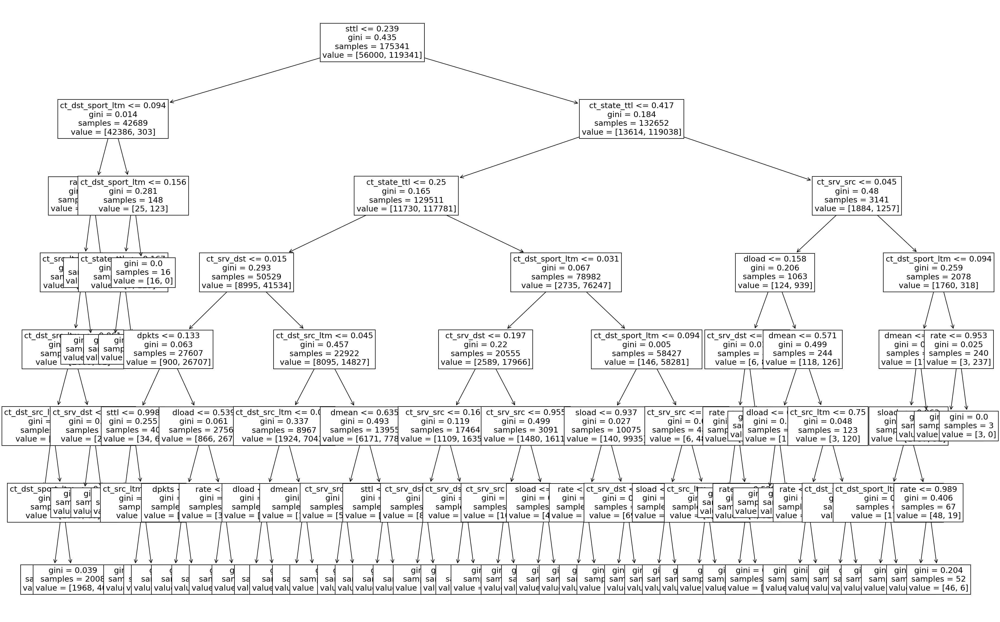

In [72]:
from sklearn import tree
plt.figure(figsize=(30, 20), dpi=150)
tree.plot_tree(classifier, feature_names = train_x.columns, fontsize=14)
plt.show()

In [204]:
# various combinations of the parameters were tried, in particular max_depth=8 is optimal
# for example, max_depth= 10 with '30' features gives the same result, but worst performance
# random_state is set to an integer to obtain a deterministic behaviour in fitting
classifier = DecisionTreeClassifier(criterion='gini', random_state=0, max_depth=8, class_weight='balanced', ccp_alpha=0)
classifier = classifier.fit(train_x, train_y_bin)

See if pruning is necessary (spoiler, no):

In [205]:
path = classifier.cost_complexity_pruning_path(train_x, train_y_bin)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

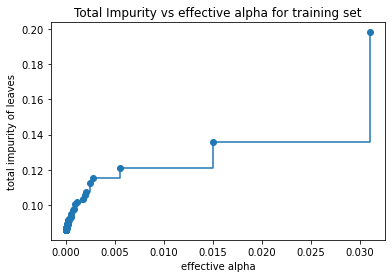

In [206]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [193]:
# ccp_alphas = ccp_alphas[ccp_alphas >= 0.]

In [207]:
ccp_alphas.shape

(91,)

In [208]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(train_x, train_y_bin)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.3020027359559275


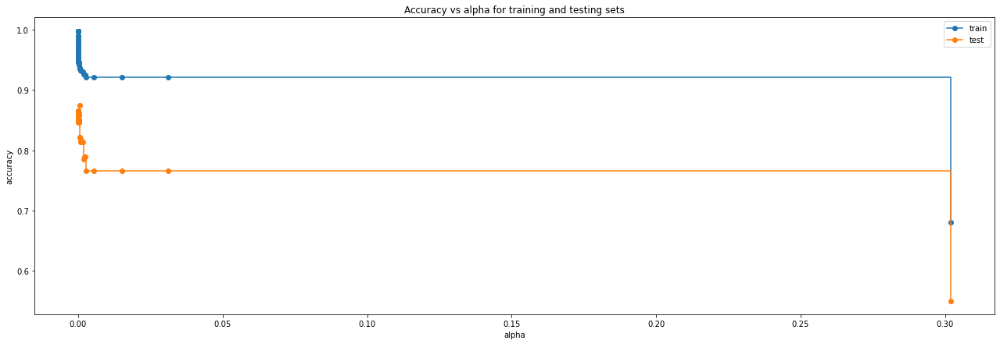

In [209]:
train_scores = [clf.score(train_x, train_y_bin) for clf in clfs]
test_scores = [clf.score(test_x, test_y_bin) for clf in clfs]

fig, ax = plt.subplots(figsize=(22,7))
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [210]:
pred_y_bin = classifier.predict(test_x)

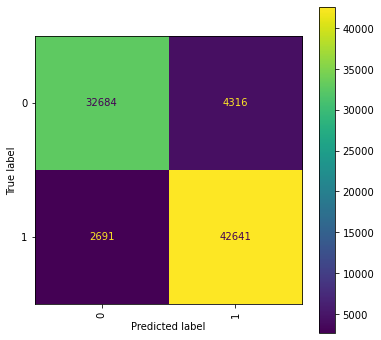

In [211]:
fig, ax = plt.subplots(figsize=(6, 6))
disp = ConfusionMatrixDisplay.from_predictions(test_y_bin, pred_y_bin, xticks_rotation='vertical', ax=ax)
plt.show()

In [212]:
print(classification_report(test_y_bin, pred_y_bin))

              precision    recall  f1-score   support

           0       0.92      0.88      0.90     37000
           1       0.91      0.94      0.92     45332

    accuracy                           0.91     82332
   macro avg       0.92      0.91      0.91     82332
weighted avg       0.92      0.91      0.91     82332



### TO DO comments

### Multiclass and Imbalance Problem

In [242]:
tree_multi = DecisionTreeClassifier(criterion='gini', random_state=0, ccp_alpha=0)
tree_multi = tree_multi.fit(train_x, train_y_multi)
pred_y_multi = tree_multi.predict(test_x)

In [235]:
# path = tree_multi.cost_complexity_pruning_path(train_x, train_y_multi)
# ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

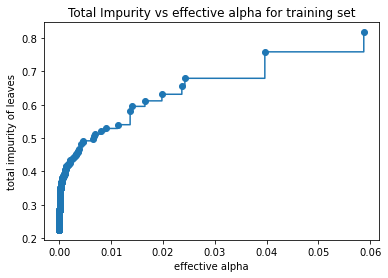

In [236]:
# fig, ax = plt.subplots()
# ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
# ax.set_xlabel("effective alpha")
# ax.set_ylabel("total impurity of leaves")
# ax.set_title("Total Impurity vs effective alpha for training set")

In [238]:
# ccp_alphas = ccp_alphas[ccp_alphas > 0]
# ccp_alphas

array([8.47032947e-22, 8.47032947e-22, 1.58603289e-21, ...,
       3.96572541e-02, 5.87610704e-02, 8.28614229e-02])

In [239]:
# clfs = []
# # i = 0
# for ccp_alpha in ccp_alphas:
#     clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
#     clf.fit(train_x, train_y_bin)
#     clfs.append(clf)
# #     print(i)
# #     i += 1
# print(
#     "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
#         clfs[-1].tree_.node_count, ccp_alphas[-1]
#     )
# )

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338


6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977


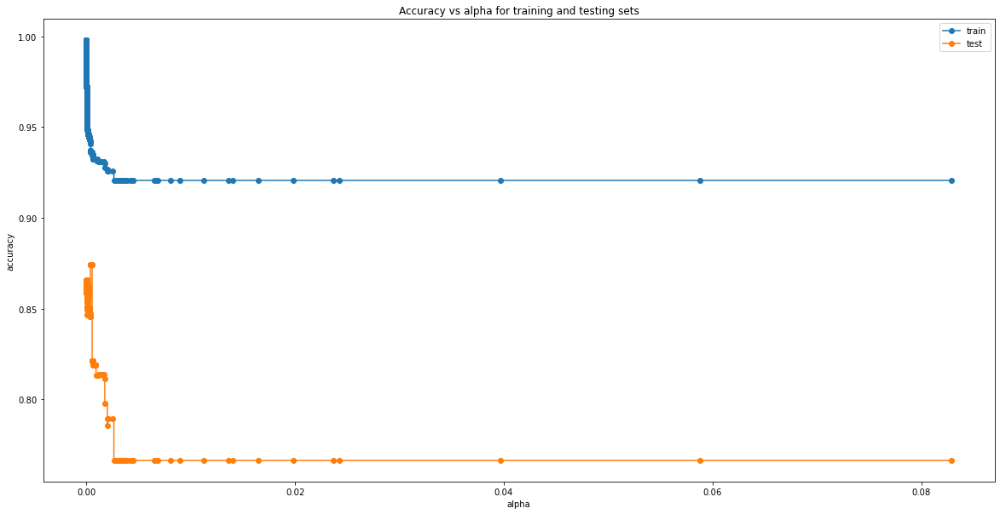

In [241]:
# train_scores = [clf.score(train_x, train_y_bin) for clf in clfs]
# test_scores = [clf.score(test_x, test_y_bin) for clf in clfs]

# fig, ax = plt.subplots(figsize=(20,10))
# ax.set_xlabel("alpha")
# ax.set_ylabel("accuracy")
# ax.set_title("Accuracy vs alpha for training and testing sets")
# ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
# ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
# ax.legend()
# plt.show()

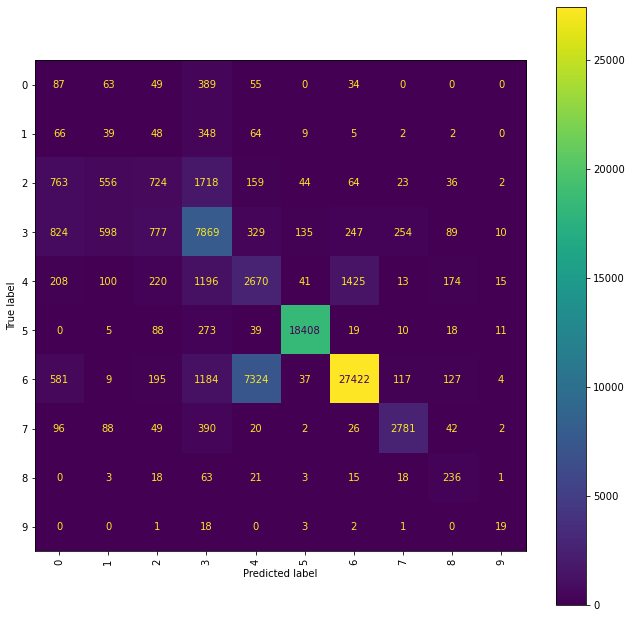

In [243]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y_multi, xticks_rotation='vertical', ax=ax)
plt.show()

In [244]:
print(classification_report(test_y_multi, pred_y_multi))

              precision    recall  f1-score   support

           0       0.03      0.13      0.05       677
           1       0.03      0.07      0.04       583
           2       0.33      0.18      0.23      4089
           3       0.59      0.71      0.64     11132
           4       0.25      0.44      0.32      6062
           5       0.99      0.98      0.98     18871
           6       0.94      0.74      0.83     37000
           7       0.86      0.80      0.83      3496
           8       0.33      0.62      0.43       378
           9       0.30      0.43      0.35        44

    accuracy                           0.73     82332
   macro avg       0.46      0.51      0.47     82332
weighted avg       0.80      0.73      0.76     82332



With just a few lines of code and no tuning at all, a decent classification accuracy is obtained. However, this number is quite meaningless without considering the distribution of the test set (shown below). We know that such a measure is not acceptable for an unbalanced dataset, because we are interested in the *minority* class. If we take a look at some other measure like the **precision** (percentage of tuples labeled as positive and actually such, *TP/(TP+FP)*) and the **recall**  (percentage of positive tuples labeled as such, *TP/P*) the results are not very good. For example, the 'Analysis' attack category has a precision = 2% and a recall = 9%. 
A good parameter to look at is the F1-Score, e.g. an harmonic mean of precision and recall.

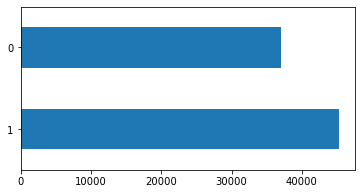

In [228]:
test_attack_cats = test_y_bin.value_counts()
test_attack_cats.plot(kind='barh', figsize=(6,3), fontsize=10);

In the confusion matrix, the diagonal values are the counts of the correctly classified samples. Each row represents the true class, and each column represents the predicted class. For instance, the number in the second row and in third column represents the number of samples that are actually of class `Backdoor` that were classfied as `DoS`.

Simlarly to the training set, the test distribution is not balanced across categories:

In [232]:
test_y_multi.value_counts().apply(lambda x: (x / float(len(test_y_multi))*100))

6    44.939999
5    22.920614
3    13.520867
4     7.362872
2     4.966477
7     4.246223
0     0.822281
1     0.708109
8     0.459117
9     0.053442
dtype: float64

We see that the 44% of the test data belong to the `Normal` class, 23% to the `Generic` one, 14% to `Exploits`, 7% to `Fuzzers`, whereas only the 0,005% of the data belongs to the `Worms` class, the 0,04% belongs to the `Shellcode`, 0,07% to `Backdoor` and 0,08% to `Analysis`. We can see the problem in the `Shellcode` row for example, the number of times it is correctly classified is similar to the number of times it is wrongly classified. It could have been not enough information for the trained model to learn from the latter classes to correctly identify them. We must face the problem of class imbalance. 

### Sampling

As we know, there are two possible remedies: undersampling (e.g., prioritize the removal of samples that are very similar to other samples that will remain in the dataset) and oversampling (e.g., generate synthetic data points for minority classes using SMOTE). A popular method is to first oversample the minority class and then undersample to tighten the class distribution discrepancy. 

In [246]:
print(pd.Series(train_y_multi).value_counts())

6    56000
5    40000
3    33393
4    18184
2    12264
7    10491
0     2000
1     1746
8     1133
9      130
dtype: int64


In [ ]:
# !pip install imblearn

In [282]:
from imblearn.over_sampling import SMOTE

mean_class_size = int(pd.Series(train_y_multi).value_counts().sum() / 10)

# a lot of values were tried
strategy = { 
            #'Fuzzers': mean_class_size, 
            2: 40000, # DoS
            0: 40000, # Analysis
            1: 40000, # Backdoor
            8: 40000, # Shellcode
            9: 40000  # Worms
           }

sm = SMOTE(sampling_strategy = strategy, random_state = 0)
train_x_sm, train_y_sm = sm.fit_resample(train_x, train_y_multi)
print(pd.Series(train_y_sm).value_counts())


6    56000
1    40000
0    40000
8    40000
2    40000
9    40000
5    40000
3    33393
4    18184
7    10491
dtype: int64


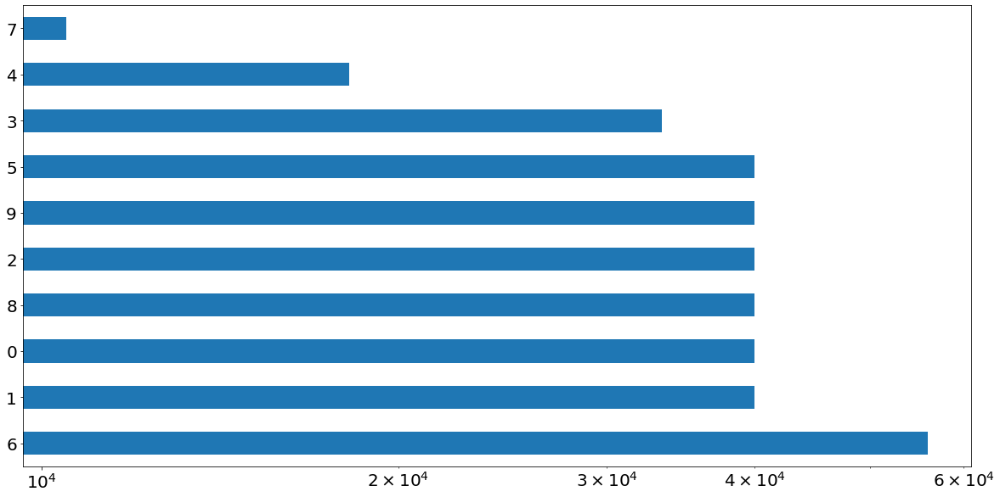

In [254]:
test_attack_cats = train_y_sm.value_counts()
test_attack_cats.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

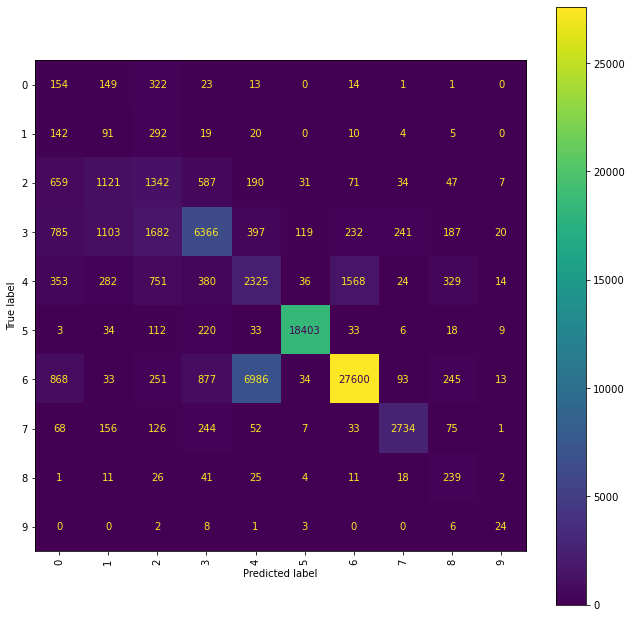

              precision    recall  f1-score   support

           0       0.05      0.23      0.08       677
           1       0.03      0.16      0.05       583
           2       0.27      0.33      0.30      4089
           3       0.73      0.57      0.64     11132
           4       0.23      0.38      0.29      6062
           5       0.99      0.98      0.98     18871
           6       0.93      0.75      0.83     37000
           7       0.87      0.78      0.82      3496
           8       0.21      0.63      0.31       378
           9       0.27      0.55      0.36        44

    accuracy                           0.72     82332
   macro avg       0.46      0.53      0.47     82332
weighted avg       0.81      0.72      0.76     82332



In [283]:
# OVERFITTING CHECK (commented because time-consuming, also tried with classification_report)
# values = [i for i in range(10, 25)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_sm, train_y_sm)
#     pred_yt = classifier.predict(test_x)
#     print(accuracy_score(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_sm)
#     print(accuracy_score(train_y_sm, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(criterion='gini', random_state=0, class_weight='balanced', ccp_alpha=0)
classifier = classifier.fit(train_x_sm, train_y_sm)
pred_y = classifier.predict(test_x)
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()
print(classification_report(test_y_multi, pred_y))

We can see an overfitting problem after a depth of 16 levels, thanks to the loop test. This is why we set max_depth to 16. 

TO DO correct Here a lot of experimentation can be made: my idea was to try first SMOTE to all the minority classes with a sampling set to *mean_class_size*, then SMOTE to all the minority classes with the strategy set to *auto*, then some experimentation mixing these values. For example, applying SMOTE only to those features with an F-score less than 0.50, or do the latter but adding also those features that worsen their measures (like Worms), and something similar. I found that the best, worst, solution is applying SMOTE to all those features with an F-score less than 50%. When I evaluated these combinations I evaluated the total sum of the F-scores of all the features. When I said best/worst is because the relative solution is in any case worst with respect to the base one without over-sampling. 

Let's see what happens applying also under-sampling:

In [284]:
print(pd.Series(train_y_sm).value_counts())

6    56000
1    40000
0    40000
8    40000
2    40000
9    40000
5    40000
3    33393
4    18184
7    10491
dtype: int64


In [287]:
from imblearn.under_sampling import RandomUnderSampler

# mean_class_size = int(pd.Series(train_y_sm).value_counts().sum() / 10)

# a lot of combinations has been tried
ratio = {
         6: mean_class_size, 
         3: mean_class_size,
         5: mean_class_size
        }

rus = RandomUnderSampler(sampling_strategy = ratio, random_state = 0)
train_x_sm_rus, train_y_sm_rus = rus.fit_resample(train_x_sm, train_y_sm)
print(pd.Series(train_y_sm_rus).value_counts())

0    40000
1    40000
2    40000
8    40000
9    40000
4    18184
3    17534
5    17534
6    17534
7    10491
dtype: int64


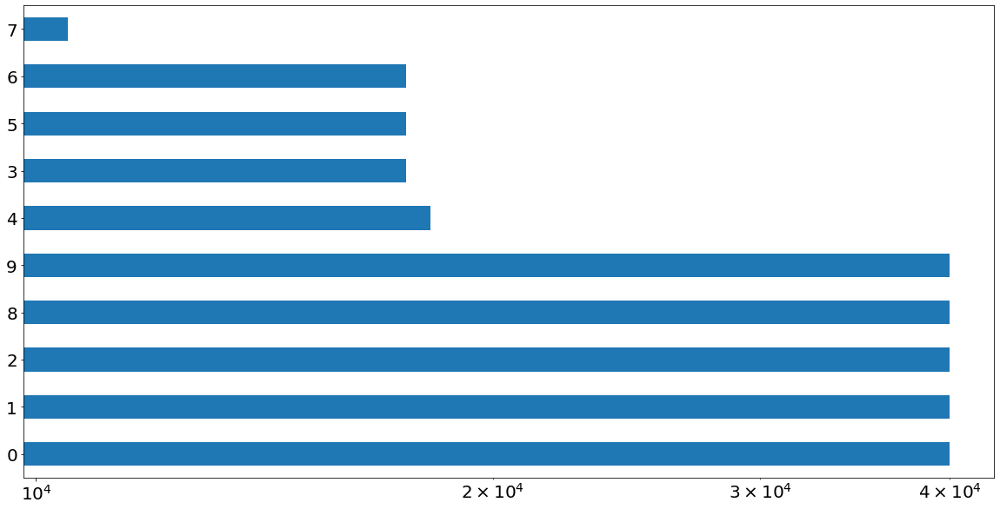

In [288]:
test_attack_cats_sm_rus = train_y_sm_rus.value_counts()
test_attack_cats_sm_rus.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

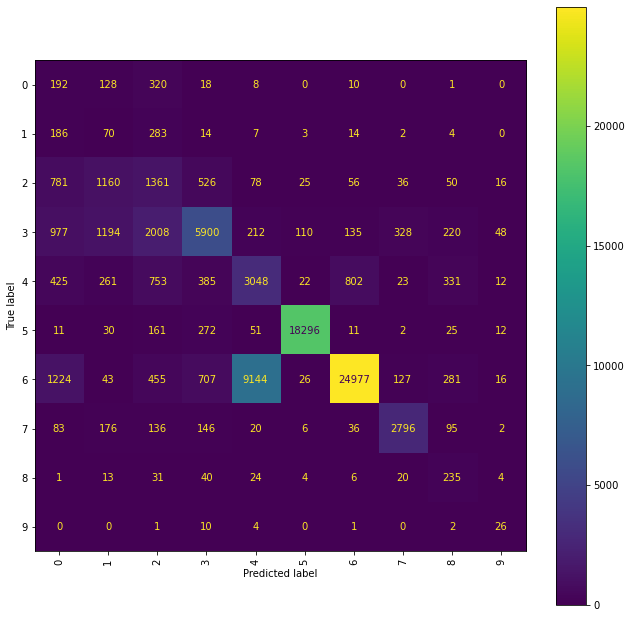

In [298]:
# OVERFITTING CHECK (commented because time-consuming)
# values = [i for i in range(10, 30)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_sm_rus, train_y_sm_rus)
#     pred_yt = classifier.predict(test_x)
#     print(classification_report(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_sm_rus)
#     print(classification_report(train_y_sm_rus, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x_sm_rus, train_y_sm_rus)
pred_y = classifier.predict(test_x)
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [291]:
print(classification_report(test_y_multi, pred_y))

              precision    recall  f1-score   support

           0       0.06      0.28      0.09       677
           1       0.03      0.21      0.06       583
           2       0.28      0.40      0.33      4089
           3       0.75      0.51      0.61     11132
           4       0.23      0.55      0.33      6062
           5       0.99      0.97      0.98     18871
           6       0.97      0.63      0.77     37000
           7       0.85      0.79      0.82      3496
           8       0.19      0.81      0.30       378
           9       0.25      0.73      0.37        44

    accuracy                           0.68     82332
   macro avg       0.46      0.59      0.47     82332
weighted avg       0.83      0.68      0.73     82332



Also here, some experimentation has been done. We can notice that the scores change a bit for some features but basically their sum remains the same. 

Our last chance is to perform only undersampling:

In [294]:
# mean_class_size = int(pd.Series(train_y_sm).value_counts().sum() / 10)

# a lot of combinations has been tried
ratio = {
         6: mean_class_size, 
         3: mean_class_size,
         5: mean_class_size
        }

orus = RandomUnderSampler(sampling_strategy = ratio, random_state = 0)
train_x_orus, train_y_orus = orus.fit_resample(train_x, train_y_multi)
print(pd.Series(train_y_orus).value_counts())

4    18184
3    17534
5    17534
6    17534
2    12264
7    10491
0     2000
1     1746
8     1133
9      130
dtype: int64


In [ ]:
test_attack_cats_orus = train_y_orus.value_counts()
test_attack_cats_orus.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

In [299]:
# OVERFITTING CHECK (commented because time-consuming)
# values = [i for i in range(10, 30)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_orus, train_y_orus)
#     pred_yt = classifier.predict(test_x)
#     print(classification_report(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_orus)
#     print(classification_report(train_y_orus, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x_orus, train_y_orus)
pred_y = classifier.predict(test_x)

In [300]:
print(classification_report(test_y_multi, pred_y))

              precision    recall  f1-score   support

           0       0.02      0.10      0.04       677
           1       0.03      0.07      0.04       583
           2       0.30      0.41      0.35      4089
           3       0.69      0.57      0.63     11132
           4       0.24      0.55      0.33      6062
           5       0.99      0.97      0.98     18871
           6       0.95      0.68      0.79     37000
           7       0.82      0.82      0.82      3496
           8       0.32      0.66      0.43       378
           9       0.31      0.48      0.38        44

    accuracy                           0.71     82332
   macro avg       0.47      0.53      0.48     82332
weighted avg       0.82      0.71      0.75     82332



Also in this case some experiments have been done, but the point remains the same, we can get some better behaviour in classifying some minority classes but with no such a general great improvement. 
We can conclude that some features like *Analysis* and *Backdoors* probably do not have a suitable fingerprint on the network statistics, because even raising up their instances, making them the majority classes (e.g., first oversample them to the max, and then undersample the other major categories), makes a little difference on their metrics. Another possible reason is the nature of the data that were sampled when the dataset was created. 
Furthermore, the unbalanced multiclass classification problem is hard to solve.

In the following i decided to apply the **stratified K fold cross validation** to choose the right sampling to maintain (spoiler: the application of both SMOTE and RandomUnderSampling). 

In [312]:
# compute average per-class metrics  
def computeAverageMetrics(df_list):
    df_concat = pd.concat(df_list)
    grouped_by_row_index = df_concat.groupby(df_concat.index)
    df_avg = grouped_by_row_index.mean()
    df_avg.transpose()
    return df_avg

# compute average accuracy
def computeAverageAccuracy(accuracy_list):
    accuracy_avg = np.mean(accuracy_list)
    print("Average Accuracy score == {:.2f} %".format(accuracy_avg*100))
    
# compute average F1-score
def computeAverageF1Score(avg_df):
    f1_avg = avg_df.transpose()['f1-score'].mean()
    print("Average F1-score == {:.2f} %".format(f1_avg*100))

In [311]:
# this is not extremely necessary because the test set is not too small
# but is preferred considering the unbalanced nature of the dataset

def applyStratifiedKFold(classifier, multi):
    skf = StratifiedKFold(n_splits=10, shuffle=True)
    
    df_all = pd.concat([train_x, test_x], axis=0)

    if not multi:
        gt_all = pd.concat([train_y_bin, test_y_bin], axis=0)
    else: 
        gt_all = pd.concat([train_y_multi, test_y_multi], axis=0)
    
    list_df = []
    list_accuracy = []

    k = 1
    for train_idx, test_idx in skf.split(df_all, gt_all):

        print(f'FOLD {k}:')

        # fit and predict using classifier
        x_tr = df_all.iloc[train_idx]
        y_tr = gt_all.iloc[train_idx]
        x_test = df_all.iloc[test_idx]
        y_test = gt_all.iloc[test_idx]

        clf = classifier
        clf.fit(x_tr, y_tr)
        y_pred = clf.predict(x_test)

        # compute classification report
        cr = classification_report(y_test, y_pred, output_dict = True)

        # store accuracy
        list_accuracy.append(cr['accuracy'])

        # store per-class metrics as a dataframe
        df = pd.DataFrame({k:v for k,v in cr.items() if k != 'accuracy'})
        display(df)
        list_df.append(df)
        k += 1
        print("")
    
    return list_df, list_accuracy


#### binary cross validation

In [390]:
dt_bin = DecisionTreeClassifier(random_state=0, class_weight='balanced', ccp_alpha=0)
list_df, list_accuracy = applyStratifiedKFold(dt_bin, 0)

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.914750,0.954443,0.934597,0.940117
recall,0.919570,0.951603,0.935587,0.940042
f1-score,0.917154,0.953021,0.935087,0.940076
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.916004,0.953093,0.934549,0.939707
recall,0.916989,0.952514,0.934752,0.939693
f1-score,0.916497,0.952803,0.934650,0.939700
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.911085,0.952198,0.931642,0.937360
recall,0.915591,0.949538,0.932565,0.937287
f1-score,0.913333,0.950867,0.932100,0.937320
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.917332,0.951518,0.934425,0.939179
recall,0.913978,0.953483,0.933731,0.939225
f1-score,0.915652,0.952499,0.934076,0.939200
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.916370,0.951030,0.933700,0.938520
recall,0.913118,0.952936,0.933027,0.938565
f1-score,0.914741,0.951982,0.933362,0.938541
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.910714,0.952300,0.931507,0.937290
recall,0.915806,0.949293,0.932549,0.937207
f1-score,0.913253,0.950794,0.932024,0.937244
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.910942,0.951326,0.931134,0.936751
recall,0.913978,0.949535,0.931757,0.936702
f1-score,0.912458,0.950430,0.931444,0.936725
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.920441,0.952470,0.936456,0.940910
recall,0.915591,0.955305,0.935448,0.940971
f1-score,0.918010,0.953885,0.935948,0.940937
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.912137,0.950902,0.931520,0.936911
recall,0.913118,0.950325,0.931722,0.936896
f1-score,0.912628,0.950614,0.931621,0.936903
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.912936,0.951617,0.932276,0.937656
recall,0.914409,0.950750,0.932579,0.937633
f1-score,0.913672,0.951183,0.932427,0.937644
support,9300.000000,16467.000000,25767.000000,25767.000000


In [391]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.914740,0.914271,0.915215,9300.0
1,0.951808,0.952090,0.951528,16467.3
macro avg,0.933274,0.933181,0.933372,25767.3
weighted avg,0.938429,0.938440,0.938422,25767.3


In [392]:
computeAverageAccuracy(list_accuracy)

Average Accuracy score == 93.84 %


In [393]:
computeAverageF1Score(df_avg)

Average F1-score == 93.46 %


#### multiclass cross validation

In [394]:
dt_multi = DecisionTreeClassifier(random_state=0, class_weight='balanced', ccp_alpha=0)
list_df, list_accuracy = applyStratifiedKFold(dt_multi, 1)

FOLD 1:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.065407,0.016410,0.304738,0.824648,0.650271,0.988207,0.912391,0.894247,0.570423,0.421053,0.564779,0.831083
recall,0.167910,0.141631,0.291131,0.525938,0.594227,0.982164,0.908172,0.756080,0.536424,0.444444,0.534812,0.764941
f1-score,0.094142,0.029412,0.297779,0.642260,0.620987,0.985176,0.910276,0.819380,0.552901,0.432432,0.538475,0.791171
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 2:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.051095,0.020783,0.287129,0.816980,0.652466,0.989710,0.915098,0.880276,0.565217,0.736842,0.591560,0.829490
recall,0.130597,0.184549,0.266055,0.527285,0.600000,0.980296,0.909785,0.731044,0.516556,0.777778,0.562395,0.763039
f1-score,0.073452,0.037359,0.276190,0.640917,0.625134,0.984980,0.912434,0.798750,0.539792,0.756757,0.564577,0.789581
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 3:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.041249,0.013882,0.316100,0.837658,0.683126,0.988687,0.916079,0.894604,0.562500,0.687500,0.594138,0.838477
recall,0.138060,0.120172,0.261774,0.536492,0.587871,0.979620,0.922581,0.758941,0.592105,0.647059,0.554467,0.769055
f1-score,0.063519,0.024889,0.286383,0.654073,0.631929,0.984132,0.919319,0.821207,0.576923,0.666667,0.562904,0.796598
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5888.000000,9300.000000,1398.000000,152.000000,17.000000,25768.000000,25768.000000



FOLD 4:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.044156,0.017299,0.289769,0.828440,0.661192,0.989899,0.917694,0.871622,0.534247,0.423077,0.557739,0.832490
recall,0.126866,0.154506,0.268502,0.525938,0.581271,0.982164,0.912366,0.737670,0.516556,0.647059,0.545290,0.762526
f1-score,0.065511,0.031115,0.278730,0.643407,0.618661,0.986016,0.915022,0.799071,0.525253,0.511628,0.537441,0.790373
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 5:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.046854,0.020468,0.278764,0.826848,0.651447,0.990403,0.915504,0.888889,0.593333,0.500000,0.571251,0.831315
recall,0.130597,0.180258,0.259327,0.520099,0.594472,0.981654,0.909892,0.754825,0.589404,0.529412,0.544994,0.762720
f1-score,0.068966,0.036761,0.268695,0.638544,0.621657,0.986009,0.912689,0.816390,0.591362,0.514286,0.545536,0.789751
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 6:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.039308,0.022846,0.304987,0.837352,0.638549,0.988917,0.911056,0.890678,0.520958,0.647059,0.580171,0.831329
recall,0.093284,0.206009,0.291565,0.522686,0.580858,0.985222,0.906452,0.751251,0.576159,0.647059,0.556054,0.763147
f1-score,0.055310,0.041131,0.298125,0.643618,0.608339,0.987066,0.908748,0.815045,0.547170,0.647059,0.555161,0.789701
support,268.000000,233.000000,1636.000000,4452.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 7:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.051966,0.015618,0.288577,0.834369,0.654020,0.988535,0.912167,0.884712,0.587097,0.523810,0.574087,0.831613
recall,0.138577,0.141631,0.264059,0.512579,0.597113,0.981315,0.910108,0.756969,0.602649,0.647059,0.555206,0.761982
f1-score,0.075587,0.028133,0.275774,0.635035,0.624272,0.984912,0.911136,0.815871,0.594771,0.578947,0.552444,0.789061
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 8:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.043656,0.017103,0.286827,0.832331,0.645633,0.988735,0.911003,0.884131,0.545455,0.529412,0.568429,0.829641
recall,0.119850,0.145923,0.270171,0.528527,0.582268,0.984033,0.908065,0.752680,0.556291,0.529412,0.537722,0.762875
f1-score,0.064000,0.030617,0.278250,0.646517,0.612316,0.986378,0.909532,0.813127,0.550820,0.529412,0.542097,0.789296
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 9:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.044034,0.016137,0.293513,0.842466,0.660617,0.988891,0.914391,0.897908,0.593750,0.642857,0.589456,0.835600
recall,0.116105,0.141631,0.279511,0.524933,0.600412,0.982844,0.910753,0.766976,0.629139,0.500000,0.545230,0.766368
f1-score,0.063852,0.028973,0.286341,0.646831,0.629078,0.985858,0.912568,0.827294,0.610932,0.562500,0.555423,0.793556
support,267.000000,233.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



FOLD 10:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.045213,0.016710,0.279291,0.822268,0.659823,0.988708,0.912983,0.886002,0.614286,0.545455,0.577074,0.830007
recall,0.126866,0.137931,0.269725,0.534142,0.583093,0.981654,0.912688,0.755540,0.569536,0.333333,0.520451,0.765126
f1-score,0.066667,0.029809,0.274424,0.647603,0.619089,0.985169,0.912835,0.815586,0.591065,0.413793,0.535604,0.791115
support,268.000000,232.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000


In [395]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.069101,0.047294,0.128871,267.7
1,0.031820,0.017726,0.155424,232.9
2,0.282069,0.292969,0.272182,1635.3
3,0.643881,0.830336,0.525862,4452.5
4,0.621146,0.655714,0.590159,2424.6
5,0.985570,0.989069,0.982096,5887.1
6,0.912456,0.913837,0.911086,9300.0
7,0.814172,0.887307,0.752198,1398.7
8,0.568099,0.568726,0.568482,151.1
9,0.561348,0.565706,0.570261,17.4


In [396]:
computeAverageAccuracy(list_accuracy)

Average Accuracy score == 76.42 %


In [397]:
computeAverageF1Score(df_avg)

Average F1-score == 56.91 %


-----------------------------------------------------------------------------------
### Logistic Regression

#### Binary classification

In [398]:
# bin
# logr_bin = LogisticRegression(dual=False, C=0.1, class_weight='balanced', random_state=0, solver='lbfgs', n_jobs=-1, max_iter=10000)
# logr_bin.fit(train_x, train_y_bin)
# pred_y = logr_bin.predict(test_x)
# print(classification_report(test_y_bin, pred_y))

In [399]:
lr_bin = LogisticRegression(dual=False, C=0.1, class_weight='balanced', random_state=0, solver='lbfgs', n_jobs=-1, max_iter=10000)
list_df, list_accuracy = applyStratifiedKFold(lr_bin, 0)

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.822384,0.906466,0.864425,0.876120
recall,0.835914,0.898045,0.866979,0.875621
f1-score,0.829094,0.902236,0.865665,0.875838
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.822234,0.906022,0.864128,0.875782
recall,0.835054,0.898045,0.866549,0.875310
f1-score,0.828594,0.902016,0.865305,0.875517
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.827472,0.903722,0.865597,0.876202
recall,0.829785,0.902295,0.866040,0.876125
f1-score,0.828627,0.903008,0.865817,0.876163
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.821932,0.908392,0.865162,0.877187
recall,0.839785,0.897249,0.868517,0.876509
f1-score,0.830763,0.902786,0.866774,0.876791
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.813946,0.905895,0.859921,0.872708
recall,0.835914,0.892087,0.864001,0.871813
f1-score,0.824784,0.898938,0.861861,0.872174
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.821553,0.906515,0.864034,0.875850
recall,0.836129,0.897431,0.866780,0.875306
f1-score,0.828777,0.901950,0.865363,0.875540
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.819488,0.908396,0.863942,0.876307
recall,0.840108,0.895488,0.867798,0.875500
f1-score,0.829670,0.901896,0.865783,0.875828
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.822124,0.906444,0.864284,0.876010
recall,0.835914,0.897856,0.866885,0.875500
f1-score,0.828961,0.902129,0.865545,0.875721
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.825533,0.903104,0.864318,0.875107
recall,0.828817,0.901075,0.864946,0.874995
f1-score,0.827172,0.902088,0.864630,0.875049
support,9300.000000,16467.000000,25767.000000,25767.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.818832,0.906715,0.862774,0.874996
recall,0.836882,0.895427,0.866154,0.874297
f1-score,0.827759,0.901036,0.864397,0.874588
support,9300.000000,16467.000000,25767.000000,25767.000000


In [400]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.828420,0.821550,0.835430,9300.0
1,0.901808,0.906167,0.897500,16467.3
macro avg,0.865114,0.863859,0.866465,25767.3
weighted avg,0.875321,0.875627,0.875098,25767.3


In [401]:
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)

Average Accuracy score == 87.51 %
Average F1-score == 86.77 %


#### Multiclass classification

In [347]:
# one-versus-rest for multiclass classification
logr_classifier = LogisticRegression(dual=False, class_weight='balanced', max_iter=10000, solver='newton-cg', multi_class='ovr', n_jobs=-1)
logr_classifier.fit(train_x, train_y_multi)

LogisticRegression(class_weight='balanced', max_iter=10000, multi_class='ovr',
                   n_jobs=-1, solver='newton-cg')

In [348]:
pred_y = logr_classifier.predict(test_x)

In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [349]:
print(classification_report(test_y_multi, pred_y))

              precision    recall  f1-score   support

           0       0.05      0.50      0.09       677
           1       0.04      0.08      0.05       583
           2       0.36      0.29      0.32      4089
           3       0.74      0.45      0.56     11132
           4       0.27      0.63      0.38      6062
           5       1.00      0.96      0.98     18871
           6       0.95      0.53      0.69     37000
           7       0.29      0.45      0.35      3496
           8       0.08      0.60      0.14       378
           9       0.01      0.50      0.02        44

    accuracy                           0.61     82332
   macro avg       0.38      0.50      0.36     82332
weighted avg       0.81      0.61      0.67     82332



In [402]:
lr_multi = LogisticRegression(dual=False, class_weight='balanced', max_iter=10000, solver='newton-cg', multi_class='ovr', n_jobs=-1)
list_df, list_accuracy = applyStratifiedKFold(lr_multi, 1)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)

FOLD 1:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.070413,0.051071,0.327711,0.816689,0.441021,0.991869,0.966710,0.431503,0.082143,0.008630,0.418776,0.804024
recall,0.388060,0.133047,0.415902,0.402201,0.584330,0.973841,0.727527,0.511445,0.456954,0.444444,0.503775,0.671919
f1-score,0.119198,0.073810,0.366577,0.538971,0.502661,0.982772,0.830235,0.468085,0.139253,0.016931,0.403849,0.716003
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 2:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.075975,0.057994,0.323923,0.803734,0.428402,0.991339,0.963681,0.398016,0.096178,0.009404,0.414865,0.797530
recall,0.414179,0.158798,0.414067,0.396362,0.595876,0.972142,0.710430,0.459227,0.516556,0.500000,0.513764,0.663381
f1-score,0.128398,0.084960,0.363490,0.530907,0.498448,0.981647,0.817900,0.426436,0.162162,0.018462,0.401281,0.707381
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 3:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.075433,0.047695,0.312317,0.791592,0.443964,0.991697,0.965068,0.416271,0.100578,0.011655,0.415627,0.797686
recall,0.406716,0.128755,0.390826,0.397485,0.593234,0.973675,0.724839,0.501431,0.572368,0.588235,0.527756,0.669745
f1-score,0.127262,0.069606,0.347188,0.529227,0.507858,0.982603,0.827878,0.454899,0.171091,0.022857,0.404047,0.712234
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5888.000000,9300.000000,1398.000000,152.000000,17.000000,25768.000000,25768.000000



FOLD 4:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.062500,0.062598,0.326161,0.803442,0.434640,0.989463,0.967249,0.424985,0.106784,0.012514,0.419034,0.800527
recall,0.332090,0.171674,0.407951,0.398383,0.599422,0.972991,0.720860,0.520372,0.562914,0.647059,0.533372,0.670586
f1-score,0.105201,0.091743,0.362500,0.532653,0.503902,0.981158,0.826074,0.467866,0.179514,0.024554,0.407516,0.713170
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 5:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.066759,0.038462,0.326218,0.800924,0.441959,0.991873,0.967263,0.415648,0.092138,0.008791,0.415003,0.800570
recall,0.358209,0.103004,0.429969,0.389400,0.603135,0.974350,0.721183,0.486061,0.496689,0.470588,0.503259,0.668491
f1-score,0.112544,0.056009,0.370976,0.524025,0.510119,0.983033,0.826291,0.448105,0.155440,0.017260,0.400380,0.711843
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 6:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.069373,0.065015,0.314019,0.794265,0.424586,0.990463,0.965735,0.437345,0.100108,0.009050,0.416996,0.797611
recall,0.350746,0.180258,0.410758,0.391959,0.571370,0.970273,0.724301,0.503931,0.615894,0.470588,0.519008,0.667210
f1-score,0.115835,0.095563,0.355932,0.524891,0.487161,0.980264,0.827773,0.468283,0.172222,0.017758,0.404568,0.710360
support,268.000000,233.000000,1636.000000,4452.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 7:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.067747,0.058565,0.312016,0.791085,0.426131,0.992914,0.964557,0.401863,0.087701,0.011996,0.411457,0.795156
recall,0.344569,0.171674,0.393643,0.394654,0.586392,0.975879,0.711075,0.462473,0.543046,0.647059,0.523046,0.661816
f1-score,0.113231,0.087336,0.348108,0.526600,0.493579,0.984323,0.818643,0.430043,0.151013,0.023555,0.397643,0.706111
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 8:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.066058,0.058637,0.310716,0.802129,0.438522,0.992380,0.966425,0.422920,0.100451,0.009804,0.416804,0.799900
recall,0.352060,0.158798,0.405868,0.372417,0.597113,0.973331,0.718065,0.519657,0.589404,0.529412,0.521612,0.664959
f1-score,0.111243,0.085648,0.351975,0.508667,0.505675,0.982763,0.823936,0.466325,0.171649,0.019251,0.402713,0.708002
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 9:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.080144,0.054517,0.323782,0.801945,0.438253,0.992011,0.968008,0.417147,0.086862,0.014223,0.417689,0.800866
recall,0.415730,0.150215,0.414679,0.407457,0.600000,0.970273,0.719032,0.466047,0.529801,0.722222,0.539546,0.668956
f1-score,0.134383,0.080000,0.363636,0.540363,0.506527,0.981022,0.825148,0.440243,0.149254,0.027897,0.404847,0.712973
support,267.000000,233.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



FOLD 10:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.064208,0.048362,0.305077,0.787033,0.448754,0.990315,0.965035,0.429678,0.103832,0.007726,0.415002,0.797185
recall,0.350746,0.133621,0.389602,0.392633,0.586804,0.972652,0.727097,0.515368,0.556291,0.388889,0.501370,0.668801
f1-score,0.108545,0.071019,0.342197,0.523902,0.508578,0.981404,0.829337,0.468638,0.175000,0.015152,0.402377,0.711897
support,268.000000,232.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



Average Accuracy score == 66.76 %
Average F1-score == 42.86 %


---------------------------------------------------------------------
## Support Vector Machine

#### binary problem

In [379]:
lsvm_bin = LinearSVC(dual=False, tol=1e-05, class_weight='balanced', random_state=0, max_iter=10000)
# lsvm_bin.fit(train_x, train_y_bin)
# pred_y = lsvm_bin.predict(test_x)
# print(classification_report(test_y_bin, pred_y))
list_df, list_accuracy = applyStratifiedKFold(lsvm_bin, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)

FOLD 1:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.088737,0.067568,0.321515,0.727552,0.446539,0.989095,0.970732,0.380228,0.099783,0.014257,0.410601,0.787230
recall,0.194030,0.085837,0.488073,0.425780,0.566598,0.970613,0.723978,0.572246,0.609272,0.777778,0.541421,0.678865
f1-score,0.121780,0.075614,0.387661,0.537187,0.499455,0.979767,0.829391,0.456882,0.171482,0.028000,0.408722,0.715372
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 2:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.089701,0.077670,0.334015,0.745889,0.448809,0.991866,0.971338,0.337374,0.080357,0.012903,0.408992,0.789919
recall,0.201493,0.103004,0.499694,0.427801,0.574845,0.973501,0.725161,0.477825,0.596026,0.666667,0.524602,0.676770
f1-score,0.124138,0.088561,0.400392,0.543742,0.504068,0.982598,0.830388,0.395500,0.141621,0.025316,0.403632,0.715388
support,268.000000,233.000000,1635.000000,4453.000000,2425.000000,5887.000000,9300.000000,1398.000000,151.000000,18.000000,25768.000000,25768.000000



FOLD 3:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.087028,0.064286,0.323552,0.728342,0.455047,0.989609,0.971956,0.339033,0.081901,0.013013,0.405377,0.786491
recall,0.197761,0.077253,0.505810,0.417247,0.578383,0.970448,0.719247,0.496423,0.532895,0.764706,0.526017,0.673277
f1-score,0.120867,0.070175,0.394655,0.530554,0.509355,0.979935,0.826721,0.402903,0.141981,0.025591,0.400274,0.711537
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5888.000000,9300.000000,1398.000000,152.000000,17.000000,25768.000000,25768.000000



FOLD 4:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.081911,0.065625,0.315852,0.735306,0.438041,0.992364,0.962346,0.329719,0.074108,0.013742,0.400901,0.782177
recall,0.179104,0.090129,0.489908,0.418594,0.542492,0.971293,0.720000,0.478199,0.536424,0.764706,0.519085,0.668530
f1-score,0.112412,0.075949,0.384081,0.533486,0.484703,0.981715,0.823718,0.390315,0.130225,0.026999,0.394360,0.707588
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 5:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.091912,0.060519,0.314757,0.736527,0.446048,0.992204,0.970669,0.351843,0.086134,0.011555,0.406217,0.787367
recall,0.186567,0.090129,0.490520,0.414327,0.561056,0.972821,0.725914,0.538956,0.543046,0.647059,0.517040,0.675399
f1-score,0.123153,0.072414,0.383457,0.530325,0.496985,0.982417,0.830637,0.425748,0.148685,0.022704,0.401652,0.712925
support,268.000000,233.000000,1635.000000,4453.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 6:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.092905,0.072948,0.317520,0.737931,0.452712,0.989664,0.965027,0.358528,0.072349,0.011579,0.407116,0.786184
recall,0.205224,0.103004,0.466381,0.432615,0.564769,0.975879,0.729892,0.515368,0.483444,0.647059,0.512364,0.678193
f1-score,0.127907,0.085409,0.377816,0.545455,0.502570,0.982723,0.831150,0.422874,0.125862,0.022751,0.402452,0.715833
support,268.000000,233.000000,1636.000000,4452.000000,2424.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 7:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.095315,0.059016,0.318655,0.729502,0.443968,0.989474,0.968233,0.366999,0.089027,0.014056,0.407425,0.785563
recall,0.220974,0.077253,0.486553,0.407682,0.555464,0.974011,0.724301,0.553252,0.569536,0.823529,0.539256,0.674467
f1-score,0.133183,0.066914,0.385099,0.523055,0.493497,0.981681,0.828689,0.441277,0.153984,0.027641,0.403502,0.711514
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 8:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.084261,0.070513,0.324444,0.738133,0.453166,0.990691,0.971926,0.363971,0.091198,0.011892,0.410020,0.789735
recall,0.198502,0.094421,0.490831,0.419137,0.566598,0.976219,0.725914,0.566119,0.569536,0.647059,0.525434,0.679357
f1-score,0.118304,0.080734,0.390659,0.534670,0.503573,0.983402,0.831097,0.443077,0.157221,0.023355,0.406609,0.716169
support,267.000000,233.000000,1636.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,17.000000,25767.000000,25767.000000



FOLD 9:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.085950,0.067308,0.322027,0.746051,0.455020,0.991854,0.967521,0.350530,0.080119,0.010776,0.407716,0.788981
recall,0.194757,0.090129,0.481957,0.424304,0.575670,0.972142,0.730323,0.519657,0.536424,0.555556,0.508092,0.678348
f1-score,0.119266,0.077064,0.386085,0.540951,0.508283,0.981899,0.832353,0.418658,0.139415,0.021142,0.402512,0.716048
support,267.000000,233.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



FOLD 10:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.079365,0.059347,0.328652,0.737089,0.455199,0.990827,0.966676,0.347264,0.078558,0.011518,0.405450,0.787004
recall,0.167910,0.086207,0.500917,0.423181,0.574021,0.972482,0.720538,0.498928,0.562914,0.611111,0.511821,0.674506
f1-score,0.107784,0.070299,0.396898,0.537671,0.507751,0.981569,0.825653,0.409504,0.137875,0.022610,0.399762,0.712940
support,268.000000,232.000000,1635.000000,4452.000000,2425.000000,5887.000000,9300.000000,1399.000000,151.000000,18.000000,25767.000000,25767.000000



Average Accuracy score == 67.58 %
Average F1-score == 42.83 %


#### multiclass problem

In [ ]:
# LinearSVC implements “one-vs-the-rest” multi-class strategy, thus training n_classes models
# it scales better than SVC with kernel=linear

# VERY LONG RUNNING TIME


lsvm_multi = LinearSVC(dual=False, class_weight='balanced', max_iter=15000)
# lsvm.fit(train_x, train_y) 
# pred_y = lsvm.predict(test_x)
# print(classification_report(test_y, pred_y))
list_df, list_accuracy = applyStratifiedKFold(lsvm_multi, 1)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)


In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

## K Nearest Neighbours

In [ ]:
knn_bin = KNeighborsClassifier(n_jobs=-1)
# lsvm_bin.fit(train_x, train_y_bin)
# pred_y = lsvm_bin.predict(test_x)
# print(classification_report(test_y_bin, pred_y))
list_df, list_accuracy = applyStratifiedKFold(knn_bin, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.903302,0.948443,0.925872,0.932151
recall,0.909032,0.945045,0.927039,0.932048
f1-score,0.906158,0.946741,0.926449,0.932094
support,9300.000000,16468.000000,25768.000000,25768.000000



FOLD 2:


In [380]:
knn = KNeighborsClassifier(n_jobs=-1)
knn.fit(train_x,train_y_bin)

KNeighborsClassifier(n_jobs=-1)

In [381]:
pred_y = knn.predict(test_x)

In [382]:
print(classification_report(test_y_bin, pred_y))

              precision    recall  f1-score   support

           0       0.93      0.73      0.82     37000
           1       0.81      0.96      0.88     45332

    accuracy                           0.85     82332
   macro avg       0.87      0.84      0.85     82332
weighted avg       0.87      0.85      0.85     82332



## Random Forest

In [ ]:
randf = RandomForestClassifier(class_weight = 'balanced', n_jobs=-1)
randf.fit(train_x, train_y)

pred_y = randf.predict(test_x)
print(classification_report(test_y, pred_y))

## Multi-layer Perceptron

In [ ]:
mlp = MLPClassifier(random_state=123, solver='adam', max_iter=10000)
mlp.fit(train_x, train_y)

In [ ]:
pred_y = mlp.predict(test_x)
print(classification_report(test_y, pred_y))

# TEST for class change

In [ ]:
train_y

In [ ]:
train_y_9 = train_y.copy(deep=True)
train_y_9.loc[train_y_9 == 'Backdoor'] = 'Backdoor_or_Dos'
train_y_9.loc[train_y_9 == 'DoS'] = 'Backdoor_or_Dos'


test_y_9 = test_y.copy(deep=True)
test_y_9.loc[test_y_9 == 'Backdoor'] = 'Backdoor_or_Dos'
test_y_9.loc[test_y_9 == 'DoS'] = 'Backdoor_or_Dos'
test_y_9.sample(100)


In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_9)
pred_y = classifier.predict(test_x)
print(classification_report(test_y_9, pred_y))

In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_9, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
train_y_7 = train_y_9.copy(deep=True)
train_y_7.loc[train_y_7 == 'Backdoor_or_Dos'] = 'BADE'
train_y_7.loc[train_y_7 == 'Analysis'] = 'BADE'
train_y_7.loc[train_y_7 == 'Exploits'] = 'BADE'


test_y_7 = test_y_9.copy(deep=True)
test_y_7.loc[test_y_7 == 'Backdoor_or_Dos'] = 'BADE'
test_y_7.loc[test_y_7 == 'Analysis'] = 'BADE'
test_y_7.loc[test_y_7 == 'Exploits'] = 'BADE'

test_y_7.sample(100)


In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_7)
pred_y = classifier.predict(test_x)
print(classification_report(test_y_7, pred_y))


In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_7, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
train_y_2 = train_y_7.copy(deep=True)
train_y_2.loc[train_y_7 != 'Normal'] = 'Attack'


test_y_2 = test_y_7.copy(deep=True)
test_y_2.loc[test_y_2 != 'Normal'] = 'Attack'


test_y_2.sample(100)

In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_2)
pred_y_2 = classifier.predict(test_x)
print(classification_report(test_y_2, pred_y_2))


In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_2, pred_y_2, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
# randf = RandomForestClassifier(class_weight = 'balanced', n_jobs=-1)
# randf.fit(train_x, train_y_2)

# pred_y_2 = randf.predict(test_x)
# print(classification_report(test_y_2, pred_y_2))

mlp = MLPClassifier(random_state=123, solver='adam', max_iter=10000)
mlp.fit(train_x, train_y_2)
pred_y_2 = mlp.predict(test_x)
print(classification_report(test_y_2, pred_y_2))

# Unsupervised Learning

In [ ]:
def evaluate_clustering(y_true, y_pred):
    # Matrix $C$ such that $C_{ij}$ is the number of samples in true class $i$ and in predicted cluster $j$.
    cm = contingency_matrix(y_true, y_pred)
    print(f'contingency matrix: \n {cm}')
    for enu, row in enumerate(cm):
        print(f'Row{enu}: sum = {sum(row)}')    
    homogeneity, completeness, v_measure = homogeneity_completeness_v_measure(y_true, y_pred)
#   homogeneity is high if all the clusters contain only data points which are members of a single class.
    print(f'homogeneity score: {homogeneity}')
#   completeness is high if all the data points that are members of a given class are elements of the same cluster.
    print(f'completeness score: {completeness}')
    print(f'v-measure score: {v_measure}')

In [ ]:
train_y_bin = train_y.apply(lambda x: 'normal' if x == 'Normal' else 'attack')
train_y_bin.value_counts()

In [ ]:

def plot_pca(X,Y):
    # Use PCA to reduce dimensionality so we can visualize the dataset on a 2d plot
    pca = PCA(n_components=2)

    data_pca = pca.fit_transform(X)

    print(f'percentage of variance explained by principal components: {pca.explained_variance_ratio_}')
    print(f'sum: {sum(pca.explained_variance_ratio_)}')

    plt.figure(figsize=(15,10))
    colors = ['navy', 'turquoise', 'darkorange', 'red', 'purple', 'green', 'pink', 'yellow', 'black', 'orange']
    
    for color, cat in zip(colors, np.unique(Y)):
        plt.scatter(data_pca[Y==cat, 0], data_pca[Y==cat, 1],
                    color=color, alpha=.8, lw=2, label=cat)
    plt.legend(loc='best', shadow=False, scatterpoints=1)

    plt.show()

    
# %matplotlib notebook
plot_pca(train_x, train_y)
plot_pca(train_x, train_y_bin)


In [ ]:
def apply_kmeans(X, y, k_values, n_components = 2):
    for k in k_values:
        print(f'k = {k}')
        kmeans = KMeans(n_clusters = k, random_state = 17).fit(X)
        pred_y = kmeans.labels_
        evaluate_clustering(y, pred_y)

        
# If 0 < n_components < 1 and svd_solver == 'full' (automatically selected), 
# select the number of components such that 
# the amount of variance that needs to be explained is greater 
# than the percentage specified by n_components.
for components in [0.95,2,None]: # arguments for the PCA reduction, different cases
    print()
    if components:
        print(components)
        pca = PCA(n_components=components)
        data_clustering = pca.fit_transform(train_x)
    else:
        data_clustering = train_x
    print(f'[transformed] space shape: {data_clustering.shape}')
    apply_kmeans(data_clustering, train_y, [10])
#     apply_kmeans(data_pca,train_y,[8])

In [ ]:
for components in [0.95,2,None]:
    print()
    if components:
        pca = PCA(n_components = components)
        data_clustering = pca.fit_transform(train_x)
    else:
        data_clustering = train_x
    print(f'[transformed] space shape: {data_clustering.shape}')
    apply_kmeans(data_clustering, train_y_bin, [2])

As we can see from the previous results, this dataset is absolutely not suitable for a clustering approach. 
### TODO comments

# Outlier Detection

In [ ]:
train_y.value_counts().index

In [ ]:
final_indices = []
for net_type in train_y.value_counts().index:
    if net_type == 'Normal':
        final_indices.extend(train_y[train_y == net_type].index.values)
    final_indices.extend(train_y[train_y == net_type].sample(10).index.values)
len(final_indices)
train_y_sample = train_y.loc[final_indices]
train_y_bin_sample = train_y_bin.loc[final_indices]
print(train_y_sample.value_counts())
print(train_y_bin_sample.value_counts())
train_x_sample = train_x.loc[final_indices,:]

In [ ]:
def apply_LOF(X, contamination):
    lof = LOF(contamination = contamination)
    y_lof = lof.fit_predict(X)
    unique, counts = np.unique(y_lof, return_counts = True)
    print(dict(zip(unique, counts)))
    pred_y = np.minimum(y_lof,0)*(-1)
    return pred_y

pca = PCA(n_components=0.95)
data_clustering = pca.fit_transform(train_x_sample)

print(f'[transformed] space shape: {data_clustering.shape}')

for contamination in [0.0005, 0.001, 'auto']:
    print('contamination', contamination)
    pred_y = apply_LOF(data_clustering, contamination)
    evaluate_clustering(train_y_sample, pred_y)
    evaluate_clustering(train_y_bin_sample, pred_y)


In [ ]:
train_y_fuzzers = train_y.apply(lambda x: 'outlier' if x == 'Fuzzers' else 'normal')

In [ ]:
pca = PCA(n_components=0.95)
data_clustering = pca.fit_transform(train_x)
print(f'[transformed] space shape: {data_clustering.shape}')

for contamination in [0.0005,'auto']:
    print()
    print('contamination', contamination)
    pred_y = apply_LOF(data_clustering, contamination)
    evaluate_clustering(train_y_fuzzers, pred_y)
